In [133]:
import chess
import chess.pgn
import numpy as np
import xgboost as xgb
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import MultinomialNB
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier
from sklearn.metrics import accuracy_score
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import SimpleRNN, Dense, Dropout, GRU, LSTM
from tensorflow.keras import regularizers
from tensorflow.keras.optimizers import Adam

In [2]:
class Chess_opening:
    def __init__(self):
        self.opening = {
            'A00': 'Irregular chess opening',
            'A01': 'Nimzovich-Larsen attack',
            'A02': 'Bird opening',
            'A03': 'Bird opening',
            'A04': 'Reti opening',
            'A05': 'Reti opening',
            'A06': 'Reti opening',
            'A07': 'Reti opening',
            'A08': 'Reti opening',
            'A09': 'Reti opening',
            'A10': 'English opening',
            'A11': 'English opening',
            'A12': 'English opening',
            'A13': 'English opening',
            'A14': 'English opening',
            'A15': 'English opening',
            'A16': 'English opening',
            'A17': 'English opening',
            'A18': 'English opening',
            'A19': 'English opening',
            'A20': 'English opening',
            'A21': 'English opening',
            'A22': 'English opening',
            'A23': 'English opening',
            'A24': 'English opening',
            'A25': 'English opening',
            'A26': 'English opening',
            'A27': 'English opening',
            'A28': 'English opening',
            'A29': 'English opening',
            'A30': 'English opening',
            'A31': 'English opening',
            'A32': 'English opening',
            'A33': 'English opening',
            'A34': 'English opening',
            'A35': 'English opening',
            'A36': 'English opening',
            'A37': 'English opening',
            'A38': 'English opening',
            'A39': 'English opening',
            'A40': '1.d4 other',
            'A41': '1.d4 other',
            'A42': '1.d4 other',
            'A43': '1.d4 other',
            'A44': '1.d4 other',
            'A45': '1.d4 other',
            'A46': '1.d4 other',
            'A47': '1.d4 other',
            'A48': '1.d4 other',
            'A49': '1.d4 other',
            'A50': '1.d4 other',
            'A51': 'Budapest gambit',
            'A52': 'Budapest gambit',
            'A53': 'Old Indian defence',
            'A54': 'Old Indian defence',
            'A55': 'Old Indian defence',
            'A56': 'Benoni defense',
            'A57': 'Benko gambit',
            'A58': 'Benko gambit',
            'A59': 'Benko gambit',
            'A60': 'Benoni defense',
            'A61': 'Benoni defense',
            'A62': 'Benoni defense',
            'A63': 'Benoni defense',
            'A64': 'Benoni defense',
            'A65': 'Benoni defense',
            'A66': 'Benoni defense',
            'A67': 'Benoni defense',
            'A68': 'Benoni defense',
            'A69': 'Benoni defense',
            'A70': 'Benoni defense',
            'A71': 'Benoni defense',
            'A72': 'Benoni defense',
            'A73': 'Benoni defense',
            'A74': 'Benoni defense',
            'A75': 'Benoni defense',
            'A76': 'Benoni defense',
            'A77': 'Benoni defense',
            'A78': 'Benoni defense',
            'A79': 'Benoni defense',
            'A80': 'Dutch defense',
            'A81': 'Dutch defense',
            'A82': 'Dutch defense',
            'A83': 'Dutch defense',
            'A84': 'Dutch defense',
            'A85': 'Dutch defense',
            'A86': 'Dutch defense',
            'A87': 'Dutch defense',
            'A88': 'Dutch defense',
            'A89': 'Dutch defense',
            'A90': 'Dutch defense',
            'A91': 'Dutch defense',
            'A92': 'Dutch defense',
            'A93': 'Dutch defense',
            'A94': 'Dutch defense',
            'A95': 'Dutch defense',
            'A96': 'Dutch defense',
            'A97': 'Dutch defense',
            'A98': 'Dutch defense',
            'A99': 'Dutch defense',
            'B00': '1.e4 other',
            'B01': 'Scandinavian defense',
            'B02': 'Alekhine defense',
            'B03': 'Alekhine defense',
            'B04': 'Alekhine defense',
            'B05': 'Alekhine defense',
            'B06': 'Robatsch defense',
            'B07': 'Pirc defense',
            'B08': 'Pirc defense',
            'B09': 'Pirc defense',
            'B10': 'Caro-Kann defense',
            'B11': 'Caro-Kann defense',
            'B12': 'Caro-Kann defense',
            'B13': 'Caro-Kann defense',
            'B14': 'Caro-Kann defense',
            'B15': 'Caro-Kann defense',
            'B16': 'Caro-Kann defense',
            'B17': 'Caro-Kann defense',
            'B18': 'Caro-Kann defense',
            'B19': 'Caro-Kann defense',
            'B20': 'Sicilian defense',
            'B21': 'Sicilian defense',
            'B22': 'Sicilian defense',
            'B23': 'Sicilian defense',
            'B24': 'Sicilian defense',
            'B25': 'Sicilian defense',
            'B26': 'Sicilian defense',
            'B27': 'Sicilian defense',
            'B28': 'Sicilian defense',
            'B29': 'Sicilian defense',
            'B30': 'Sicilian defense',
            'B31': 'Sicilian defense',
            'B32': 'Sicilian defense',
            'B33': 'Sicilian defense',
            'B34': 'Sicilian defense',
            'B35': 'Sicilian defense',
            'B36': 'Sicilian defense',
            'B37': 'Sicilian defense',
            'B38': 'Sicilian defense',
            'B39': 'Sicilian defense',
            'B40': 'Sicilian defense',
            'B41': 'Sicilian defense',
            'B42': 'Sicilian defense',
            'B43': 'Sicilian defense',
            'B44': 'Sicilian defense',
            'B45': 'Sicilian defense',
            'B46': 'Sicilian defense',
            'B47': 'Sicilian defense',
            'B48': 'Sicilian defense',
            'B49': 'Sicilian defense',
            'B50': 'Sicilian defense',
            'B51': 'Sicilian defense',
            'B52': 'Sicilian defense',
            'B53': 'Sicilian defense',
            'B54': 'Sicilian defense',
            'B55': 'Sicilian defense',
            'B56': 'Sicilian defense',
            'B57': 'Sicilian defense',
            'B58': 'Sicilian defense',
            'B59': 'Sicilian defense',
            'B60': 'Sicilian defense',
            'B61': 'Sicilian defense',
            'B62': 'Sicilian defense',
            'B63': 'Sicilian defense',
            'B64': 'Sicilian defense',
            'B65': 'Sicilian defense',
            'B66': 'Sicilian defense',
            'B67': 'Sicilian defense',
            'B68': 'Sicilian defense',
            'B69': 'Sicilian defense',
            'B70': 'Sicilian defense',
            'B71': 'Sicilian defense',
            'B72': 'Sicilian defense',
            'B73': 'Sicilian defense',
            'B74': 'Sicilian defense',
            'B75': 'Sicilian defense',
            'B76': 'Sicilian defense',
            'B77': 'Sicilian defense',
            'B78': 'Sicilian defense',
            'B79': 'Sicilian defense',
            'B80': 'Sicilian defense',
            'B81': 'Sicilian defense',
            'B82': 'Sicilian defense',
            'B83': 'Sicilian defense',
            'B84': 'Sicilian defense',
            'B85': 'Sicilian defense',
            'B86': 'Sicilian defense',
            'B87': 'Sicilian defense',
            'B88': 'Sicilian defense',
            'B89': 'Sicilian defense',
            'B90': 'Sicilian defense',
            'B91': 'Sicilian defense',
            'B92': 'Sicilian defense',
            'B93': 'Sicilian defense',
            'B94': 'Sicilian defense',
            'B95': 'Sicilian defense',
            'B96': 'Sicilian defense',
            'B97': 'Sicilian defense',
            'B98': 'Sicilian defense',
            'B99': 'Sicilian defense',
            'C00': 'French defense',
            'C01': 'French defense',
            'C02': 'French defense',
            'C03': 'French defense',
            'C04': 'French defense',
            'C05': 'French defense',
            'C06': 'French defense',
            'C07': 'French defense',
            'C08': 'French defense',
            'C09': 'French defense',
            'C10': 'French defense',
            'C11': 'French defense',
            'C12': 'French defense',
            'C13': 'French defense',
            'C14': 'French defense',
            'C15': 'French defense',
            'C16': 'French defense',
            'C17': 'French defense',
            'C18': 'French defense',
            'C19': 'French defense',
            'C20': '1.e4 e5 other',
            'C21': 'Center game',
            'C22': 'Center game',
            'C23': 'Bishop opening',
            'C24': 'Bishop opening',
            'C25': 'Vienna game',
            'C26': 'Vienna game',
            'C27': 'Vienna game',
            'C28': 'Vienna game',
            'C29': 'Vienna game',
            'C30': 'King gambit',
            'C31': 'King gambit',
            'C32': 'King gambit',
            'C33': 'King gambit',
            'C34': 'King gambit',
            'C35': 'King gambit',
            'C36': 'King gambit',
            'C37': 'King gambit',
            'C38': 'King gambit',
            'C39': 'King gambit',
            'C40': '1.e4 e5 2.Sf3 other',
            'C41': 'Philidor defense',
            'C42': 'Petrov defense',
            'C43': 'Petrov defense',
            'C44': '1.e4 e5 2.Sf3 Sc6 other',
            'C45': 'Scotch game',
            'C46': 'Three knights game',
            'C47': 'Four knights game',
            'C48': 'Four knights game',
            'C49': 'Four knights game',
            'C50': 'Giuoco Piano',
            'C51': 'Giuoco Piano',
            'C52': 'Giuoco Piano',
            'C53': 'Giuoco Piano',
            'C54': 'Giuoco Piano',
            'C55': 'Two knights game',
            'C56': 'Two knights game',
            'C57': 'Two knights game',
            'C58': 'Two knights game',
            'C59': 'Two knights game',
            'C60': 'Ruy Lopez',
            'C61': 'Ruy Lopez',
            'C62': 'Ruy Lopez',
            'C63': 'Ruy Lopez',
            'C64': 'Ruy Lopez',
            'C65': 'Ruy Lopez',
            'C66': 'Ruy Lopez',
            'C67': 'Ruy Lopez',
            'C68': 'Ruy Lopez',
            'C69': 'Ruy Lopez',
            'C70': 'Ruy Lopez',
            'C71': 'Ruy Lopez',
            'C72': 'Ruy Lopez',
            'C73': 'Ruy Lopez',
            'C74': 'Ruy Lopez',
            'C75': 'Ruy Lopez',
            'C76': 'Ruy Lopez',
            'C77': 'Ruy Lopez',
            'C78': 'Ruy Lopez',
            'C79': 'Ruy Lopez',
            'C80': 'Ruy Lopez',
            'C81': 'Ruy Lopez',
            'C82': 'Ruy Lopez',
            'C83': 'Ruy Lopez',
            'C84': 'Ruy Lopez',
            'C85': 'Ruy Lopez',
            'C86': 'Ruy Lopez',
            'C87': 'Ruy Lopez',
            'C88': 'Ruy Lopez',
            'C89': 'Ruy Lopez',
            'C90': 'Ruy Lopez',
            'C91': 'Ruy Lopez',
            'C92': 'Ruy Lopez',
            'C93': 'Ruy Lopez',
            'C94': 'Ruy Lopez',
            'C95': 'Ruy Lopez',
            'C96': 'Ruy Lopez',
            'C97': 'Ruy Lopez',
            'C98': 'Ruy Lopez',
            'C99': 'Ruy Lopez',
            'D00': '1.d4 d5 other',
            'D01': 'Queen pawn game',
            'D02': 'Queen pawn game',
            'D03': 'Queen pawn game',
            'D04': 'Queen pawn game',
            'D05': 'Queen pawn game',
            'D06': 'Queen gambit other',
            'D07': 'Chigorin defense',
            'D08': 'Albin countergambit',
            'D09': 'Albin countergambit',
            'D10': 'Slav defense',
            'D11': 'Slav defense',
            'D12': 'Slav defense',
            'D13': 'Slav defense',
            'D14': 'Slav defense',
            'D15': 'Slav defense',
            'D16': 'Slav defense',
            'D17': 'Slav defense',
            'D18': 'Slav defense',
            'D19': 'Slav defense',
            'D20': 'Queen gambit accepted',
            'D21': 'Queen gambit accepted',
            'D22': 'Queen gambit accepted',
            'D23': 'Queen gambit accepted',
            'D24': 'Queen gambit accepted',
            'D25': 'Queen gambit accepted',
            'D26': 'Queen gambit accepted',
            'D27': 'Queen gambit accepted',
            'D28': 'Queen gambit accepted',
            'D29': 'Queen gambit accepted',
            'D30': 'Queen gambit declined',
            'D31': 'Queen gambit declined',
            'D32': 'Queen gambit declined',
            'D33': 'Queen gambit declined',
            'D34': 'Queen gambit declined',
            'D35': 'Queen gambit declined',
            'D36': 'Queen gambit declined',
            'D37': 'Queen gambit declined',
            'D38': 'Queen gambit declined',
            'D39': 'Queen gambit declined',
            'D40': 'Queen gambit declined',
            'D41': 'Queen gambit declined',
            'D42': 'Queen gambit declined',
            'D43': 'Queen gambit declined',
            'D44': 'Queen gambit declined',
            'D45': 'Queen gambit declined',
            'D46': 'Queen gambit declined',
            'D47': 'Queen gambit declined',
            'D48': 'Queen gambit declined',
            'D49': 'Queen gambit declined',
            'D50': 'Queen gambit declined',
            'D51': 'Queen gambit declined',
            'D52': 'Queen gambit declined',
            'D53': 'Queen gambit declined',
            'D54': 'Queen gambit declined',
            'D55': 'Queen gambit declined',
            'D56': 'Queen gambit declined',
            'D57': 'Queen gambit declined',
            'D58': 'Queen gambit declined',
            'D59': 'Queen gambit declined',
            'D60': 'Queen gambit declined',
            'D61': 'Queen gambit declined',
            'D62': 'Queen gambit declined',
            'D63': 'Queen gambit declined',
            'D64': 'Queen gambit declined',
            'D65': 'Queen gambit declined',
            'D66': 'Queen gambit declined',
            'D67': 'Queen gambit declined',
            'D68': 'Queen gambit declined',
            'D69': 'Queen gambit declined',
            'D70': 'Grunfeld defense',
            'D71': 'Grunfeld defense',
            'D72': 'Grunfeld defense',
            'D73': 'Grunfeld defense',
            'D74': 'Grunfeld defense',
            'D75': 'Grunfeld defense',
            'D76': 'Grunfeld defense',
            'D77': 'Grunfeld defense',
            'D78': 'Grunfeld defense',
            'D79': 'Grunfeld defense',
            'D80': 'Grunfeld defense',
            'D81': 'Grunfeld defense',
            'D82': 'Grunfeld defense',
            'D83': 'Grunfeld defense',
            'D84': 'Grunfeld defense',
            'D85': 'Grunfeld defense',
            'D86': 'Grunfeld defense',
            'D87': 'Grunfeld defense',
            'D88': 'Grunfeld defense',
            'D89': 'Grunfeld defense',
            'D90': 'Grunfeld defense',
            'D91': 'Grunfeld defense',
            'D92': 'Grunfeld defense',
            'D93': 'Grunfeld defense',
            'D94': 'Grunfeld defense',
            'D95': 'Grunfeld defense',
            'D96': 'Grunfeld defense',
            'D97': 'Grunfeld defense',
            'D98': 'Grunfeld defense',
            'D99': 'Grunfeld defense',
            'E00': 'Catalan defense',
            'E01': 'Catalan defense',
            'E02': 'Catalan defense',
            'E03': 'Catalan defense',
            'E04': 'Catalan defense',
            'E05': 'Catalan defense',
            'E06': 'Catalan defense',
            'E07': 'Catalan defense',
            'E08': 'Catalan defense',
            'E09': 'Catalan defense',
            'E10': 'Blumenfeld gambit ',
            'E11': 'Bogo-Indian defence',
            'E12': 'Queen Indian defense',
            'E13': 'Queen Indian defense',
            'E14': 'Queen Indian defense',
            'E15': 'Queen Indian defense',
            'E16': 'Queen Indian defense',
            'E17': 'Queen Indian defense',
            'E18': 'Queen Indian defense',
            'E19': 'Queen Indian defense',
            'E20': 'Nimzowitsch defense',
            'E21': 'Nimzowitsch defense',
            'E22': 'Nimzowitsch defense',
            'E23': 'Nimzowitsch defense',
            'E24': 'Nimzowitsch defense',
            'E25': 'Nimzowitsch defense',
            'E26': 'Nimzowitsch defense',
            'E27': 'Nimzowitsch defense',
            'E28': 'Nimzowitsch defense',
            'E29': 'Nimzowitsch defense',
            'E30': 'Nimzowitsch defense',
            'E31': 'Nimzowitsch defense',
            'E32': 'Nimzowitsch defense',
            'E33': 'Nimzowitsch defense',
            'E34': 'Nimzowitsch defense',
            'E35': 'Nimzowitsch defense',
            'E36': 'Nimzowitsch defense',
            'E37': 'Nimzowitsch defense',
            'E38': 'Nimzowitsch defense',
            'E39': 'Nimzowitsch defense',
            'E40': 'Nimzowitsch defense',
            'E41': 'Nimzowitsch defense',
            'E42': 'Nimzowitsch defense',
            'E43': 'Nimzowitsch defense',
            'E44': 'Nimzowitsch defense',
            'E45': 'Nimzowitsch defense',
            'E46': 'Nimzowitsch defense',
            'E47': 'Nimzowitsch defense',
            'E48': 'Nimzowitsch defense',
            'E49': 'Nimzowitsch defense',
            'E50': 'Nimzowitsch defense',
            'E51': 'Nimzowitsch defense',
            'E52': 'Nimzowitsch defense',
            'E53': 'Nimzowitsch defense',
            'E54': 'Nimzowitsch defense',
            'E55': 'Nimzowitsch defense',
            'E56': 'Nimzowitsch defense',
            'E57': 'Nimzowitsch defense',
            'E58': 'Nimzowitsch defense',
            'E59': 'Nimzowitsch defense',
            'E60': 'King Indian defence',
            'E61': 'King Indian defence',
            'E62': 'King Indian defence',
            'E63': 'King Indian defence',
            'E64': 'King Indian defence',
            'E65': 'King Indian defence',
            'E66': 'King Indian defence',
            'E67': 'King Indian defence',
            'E68': 'King Indian defence',
            'E69': 'King Indian defence',
            'E70': 'King Indian defence',
            'E71': 'King Indian defence',
            'E72': 'King Indian defence',
            'E73': 'King Indian defence',
            'E74': 'King Indian defence',
            'E75': 'King Indian defence',
            'E76': 'King Indian defence',
            'E77': 'King Indian defence',
            'E78': 'King Indian defence',
            'E79': 'King Indian defence',
            'E80': 'King Indian defence',
            'E81': 'King Indian defence',
            'E82': 'King Indian defence',
            'E83': 'King Indian defence',
            'E84': 'King Indian defence',
            'E85': 'King Indian defence',
            'E86': 'King Indian defence',
            'E87': 'King Indian defence',
            'E88': 'King Indian defence',
            'E89': 'King Indian defence',
            'E90': 'King Indian defence',
            'E91': 'King Indian defence',
            'E92': 'King Indian defence',
            'E93': 'King Indian defence',
            'E94': 'King Indian defence',
            'E95': 'King Indian defence',
            'E96': 'King Indian defence',
            'E97': 'King Indian defence',
            'E98': 'King Indian defence',
            'E99': 'King Indian defence',
        }
        self.opening_name = {}
        for eco, name in self.opening.items():
            if name in self.opening_name:
                self.opening_name[name].append(eco)
            else:
                self.opening_name[name] = [eco]

    def get_eco(self, opening_name):
        if opening_name in self.opening_name:
            return self.opening_name[opening_name]
        else:
            return []

In [3]:
class Data:
    def __init__(self, opening_ecos):
        self.opening_ecos = opening_ecos
    
    def extract_game_data(self, game):
        headers = game.headers
        white_elo = int(headers.get('WhiteElo', 0))
        black_elo = int(headers.get('BlackElo', 0))
        result = headers.get('Result', 'N/A')
        eco = headers.get('ECO', 'N/A')
        if result == '0-1':
            result_numeric = 0
        elif result == '1/2-1/2':
            result_numeric = 1
        elif result == '1-0':
            result_numeric = 2
        else: 
            result_numeric = 'N/A'
        return white_elo, black_elo, result_numeric, eco

    def game_data(self, pgn_file):
        white_elo_list = []
        black_elo_list = []
        result_list = []
        eco_list = []
        while True:
            game = chess.pgn.read_game(pgn_file)
            if game is None:
                break
            white_elo, black_elo, result, eco = self.extract_game_data(game)
            white_elo_list.append(white_elo)
            black_elo_list.append(black_elo)
            result_list.append(result)
            eco_list.append(eco)
        return white_elo_list, black_elo_list, result_list, eco_list

    def get_data(self, pgn_file):
        with open(pgn_file, 'r') as pgn_file:
            potential_white_elo, potential_black_elo, potential_result, potential_eco = self.game_data(pgn_file)
        potential_data = np.array([np.array(i) for i in zip(potential_white_elo, potential_black_elo, potential_result, potential_eco)])
        return potential_data
    
    def clear_data(self, pgn_file):
        potential_data = self.get_data(pgn_file)
        white_potential_data = potential_data[:,0].astype(int)
        black_potential_data = potential_data[:,1].astype(int)
        result_potential_data = potential_data[:,2].astype(int)
        eco_potential_data = potential_data[:,3].astype(str)
        return white_potential_data, black_potential_data, result_potential_data, eco_potential_data
    
    def elo_boundary(self, sample_white_elo, sample_black_elo, fitting_coefficient):
        min_white_value = np.floor(sample_white_elo / fitting_coefficient) * fitting_coefficient - fitting_coefficient
        min_black_value = np.floor(sample_black_elo / fitting_coefficient) * fitting_coefficient - fitting_coefficient
        max_white_value = np.ceil(sample_white_elo / fitting_coefficient) * fitting_coefficient + fitting_coefficient
        max_black_value = np.ceil(sample_black_elo / fitting_coefficient) * fitting_coefficient + fitting_coefficient
        return min_white_value, min_black_value, max_white_value, max_black_value
    
    def filter_data(self, pgn_file, sample_white_elo, sample_black_elo, fitting_coefficient):
        white_potential_data, black_potential_data, result_potential_data, eco_potential_data = self.clear_data(pgn_file)
        min_white_value, min_black_value, max_white_value, max_black_value = self.elo_boundary(sample_white_elo,sample_black_elo,fitting_coefficient)
        full_data = []
        for (white_elo, black_elo, result, eco) in zip(white_potential_data, black_potential_data, result_potential_data, eco_potential_data):
            if eco in self.opening_ecos:
                if min_white_value <= white_elo <= max_white_value:
                    if min_black_value <= black_elo <= max_black_value:
                        full_data.append([white_elo, black_elo, result])
        full_data = np.array(full_data)
        return full_data
    
    def get_train_and_test_data(self, pgn_file, sample_white_elo, sample_black_elo, fitting_coefficient):
        full_data = self.filter_data(pgn_file, sample_white_elo, sample_black_elo, fitting_coefficient)
        X = np.array([full_data[:,0], full_data[:,1]])
        X = list(zip(X[0], X[1]))
        y = list(full_data[:,2])
        return X,y

In [14]:
class KNN:
    def __init__(self, X_train, y_train, X_test, y_test, k_neighbors):
        self.X_train = X_train
        self.y_train = y_train
        self.X_test = X_test
        self.y_test = y_test
        self.k_neighbors = k_neighbors

    def build_and_train_model(self):
        X_train = self.X_train
        y_train = self.y_train
        X_test = self.X_test
        y_test = self.y_test
        model = KNeighborsClassifier(n_neighbors=self.k_neighbors)
        model.fit(X_train, y_train)
        accuracy = model.score(X_test, y_test)
        return accuracy

In [4]:
if __name__ == "__main__":
    train_file_path = 'C:\\Users\\KK\\Master Thesis\\dane\\database.pgn'
    test_file_path = 'C:\\Users\\KK\\Master Thesis\\dane\\twic1521.pgn'
    
    opening_name = "Sicilian defense"
    sample_white_elo = 2400
    sample_black_elo = 2367

    opening = Chess_opening()
    opening_ecos = opening.get_eco(opening_name)
    
    data = Data(opening_ecos)
    
    fitting_coefficient = 100
    X_train, y_train = data.get_train_and_test_data(train_file_path, sample_white_elo, sample_black_elo,fitting_coefficient)
    X_validate, X_test_validate, y_validate, y_test_validate = train_test_split(X_train, y_train, train_size=0.8, test_size=0.2, random_state=42)
    X_test, y_test = data.get_train_and_test_data(test_file_path, sample_white_elo, sample_black_elo,fitting_coefficient)

illegal san: 'Nxf3' in rnbqkbnr/pppppppp/8/8/8/2N5/PPPPPPPP/R1BQKBNR b KQkq - 1 1 while parsing <Game at 0x1a808164a30 ('Lecomte,Robin' vs. 'Kalle,Erwin', '2023.03.11' at 'Netherlands NED')>


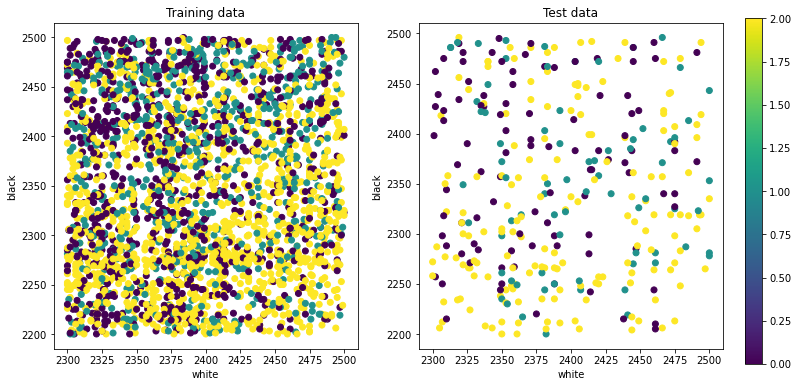

In [5]:
X_train_plot = list(zip(*X_train))
X_test_plot = list(zip(*X_test))

fig, axs = plt.subplots(1, 2, figsize=(12, 6))

sc1 = axs[0].scatter(X_train_plot[0], X_train_plot[1], c=y_train)
axs[0].set_title('Training data')
axs[0].set_xlabel('white')
axs[0].set_ylabel('black')


sc2 = axs[1].scatter(X_test_plot[0], X_test_plot[1], c=y_test)
axs[1].set_title('Test data')
axs[1].set_xlabel('white')
axs[1].set_ylabel('black')

cax = fig.add_axes([0.925, 0.09, 0.02, 0.8])
cbar2 = plt.colorbar(sc2, cax=cax)
cbar2.set_label('')



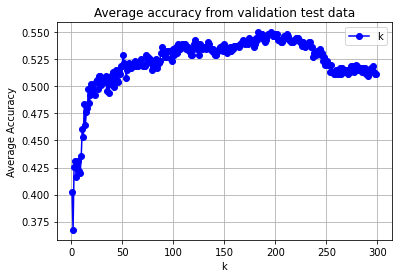

Best k from validation test data is: 183


In [7]:
k_neighbors_values = []
average_accuracy_values = []

for k in range(1, 300):
    accuracy_values_for_k = []
    for number_simulation in range(10):
        X_validate, X_test_validate, y_validate, y_test_validate = train_test_split(X_train, y_train, train_size=0.8, test_size=0.2, random_state=42)
        model_knn = KNN(X_validate, y_validate, X_test_validate, y_test_validate, k_neighbors=k)
        accuracy = model_knn.build_and_train_model()
        accuracy_values_for_k.append(accuracy)
    average_accuracy = np.mean(accuracy_values_for_k)
    k_neighbors_values.append(k)
    average_accuracy_values.append(average_accuracy)

plt.plot(k_neighbors_values, average_accuracy_values, 'bo-', label='k')
plt.title('Average accuracy from validation test data')
plt.xlabel('k')
plt.ylabel('Average Accuracy')
plt.grid(True)
plt.legend()
plt.show()

best_k = k_neighbors_values[np.argmax(average_accuracy_values)]
print(f"Best k from validation test data is: {best_k}")


No handles with labels found to put in legend.


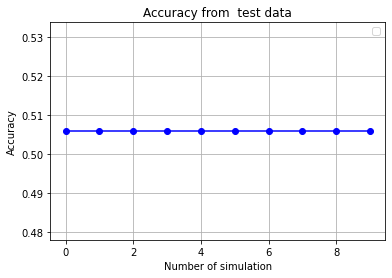

accuracy:0.5058479532163743


In [25]:
number_simulation_values = []
accuracy_values = []

for number_simulation in range(10):
    model_knn = KNN(X_train, y_train, X_test, y_test, k_neighbors=183)
    accuracy = model_knn.build_and_train_model()
    number_simulation_values.append(number_simulation)
    accuracy_values.append(accuracy)

plt.plot(number_simulation_values, accuracy_values, 'bo-')
plt.title('Accuracy from  test data')
plt.xlabel('Number of simulation')
plt.ylabel('Accuracy')
plt.grid(True)
plt.legend()
plt.show()
print(f'accuracy:{accuracy}')


# Logistic regression

In [6]:
class LR:
    def __init__(self, X_train, y_train, X_test, y_test):
        self.X_train = X_train
        self.y_train = y_train
        self.X_test = X_test
        self.y_test = y_test

    def build_and_train_model(self):
        X_train = self.X_train
        y_train = self.y_train
        X_test = self.X_test
        y_test = self.y_test
        model = LogisticRegression(random_state=42)
        model.fit(X_train, y_train)
        accuracy = model.score(X_test, y_test)
        return accuracy

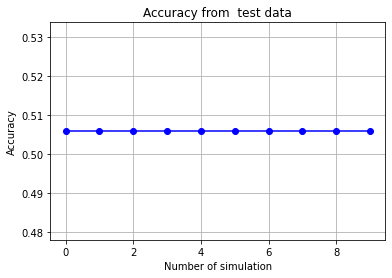

accuracy:0.5058479532163743


In [24]:
number_simulation_values = []
accuracy_values = []

for number_simulation in range(10):
    model_LR = LR(X_train, y_train, X_test, y_test)
    accuracy = model_LR.build_and_train_model()
    number_simulation_values.append(number_simulation)
    accuracy_values.append(accuracy)

plt.plot(number_simulation_values, accuracy_values, 'bo-',)
plt.title('Accuracy from  test data')
plt.xlabel('Number of simulation')
plt.ylabel('Accuracy')
plt.grid(True)
plt.show()
print(f'accuracy:{accuracy}')


# Naive Bayes

In [11]:
class NB:
    def __init__(self, X_train, y_train, X_test, y_test):
        self.X_train = X_train
        self.y_train = y_train
        self.X_test = X_test
        self.y_test = y_test

    def build_and_train_model(self):
        X_train = self.X_train
        y_train = self.y_train
        X_test = self.X_test
        y_test = self.y_test
        model = MultinomialNB()
        model.fit(X_train, y_train)
        accuracy = model.score(X_test, y_test)
        return accuracy

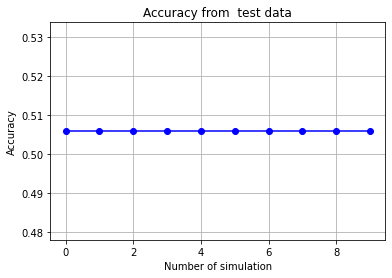

accuracy:0.5058479532163743


In [23]:
number_simulation_values = []
accuracy_values = []

for number_simulation in range(10):
    model_NB = NB(X_train, y_train, X_test, y_test)
    accuracy = model_NB.build_and_train_model()
    number_simulation_values.append(number_simulation)
    accuracy_values.append(accuracy)

plt.plot(number_simulation_values, accuracy_values, 'bo-')
plt.title('Accuracy from  test data')
plt.xlabel('Number of simulation')
plt.ylabel('Accuracy')
plt.grid(True)
plt.show()
print(f'accuracy:{accuracy}')


# SVM

In [28]:
class SVM:
    def __init__(self, X_train, y_train, X_test, y_test, C):
        self.X_train = X_train
        self.y_train = y_train
        self.X_test = X_test
        self.y_test = y_test
        self.C = C
        

    def build_and_train_model(self):
        X_train = self.X_train
        y_train = self.y_train
        X_test = self.X_test
        y_test = self.y_test
        model = SVC(C=self.C)
        model.fit(X_train, y_train)
        accuracy = model.score(X_test, y_test)
        return accuracy

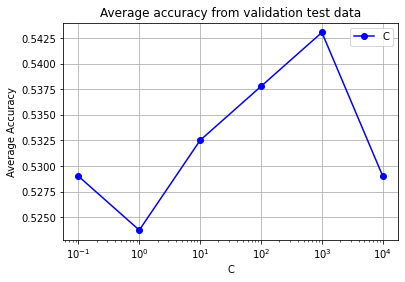

Best C from validation test data is: 1000


In [19]:
C_values = [10**i for i in range(-1,5)]
C_list = []
average_accuracy_values = []

for k in C_values:
    accuracy_values_for_C = []
    for number_simulation in range(10):
        X_validate, X_test_validate, y_validate, y_test_validate = train_test_split(X_train, y_train, train_size=0.8, test_size=0.2, random_state=42)
        model_svm = SVM(X_validate, y_validate, X_test_validate, y_test_validate, C=k)
        accuracy = model_svm.build_and_train_model()
        accuracy_values_for_C.append(accuracy)
    average_accuracy = np.mean(accuracy_values_for_C)
    C_list.append(k)
    average_accuracy_values.append(average_accuracy)

plt.plot(C_list, average_accuracy_values, 'bo-', label='C')
plt.title('Average accuracy from validation test data')
plt.xscale('log')
plt.xlabel('C')
plt.ylabel('Average Accuracy')
plt.grid(True)
plt.legend()
plt.show()

best_C = C_list[np.argmax(average_accuracy_values)]
print(f"Best C from validation test data is: {best_C}")




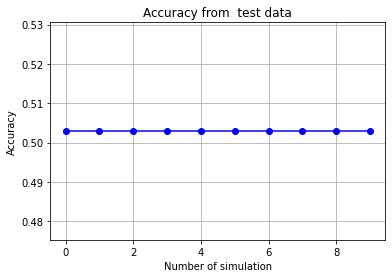

accuracy:0.5029239766081871


In [29]:
number_simulation_values = []
accuracy_values = []

for number_simulation in range(10):
    model_SVM = SVM(X_train, y_train, X_test, y_test, C=1000)
    accuracy = model_SVM.build_and_train_model()
    number_simulation_values.append(number_simulation)
    accuracy_values.append(accuracy)

plt.plot(number_simulation_values, accuracy_values, 'bo-')
plt.title('Accuracy from  test data')
plt.xlabel('Number of simulation')
plt.ylabel('Accuracy')
plt.grid(True)
plt.show()
print(f'accuracy:{accuracy}')


# Decision tree

In [6]:
class DT:
    def __init__(self, X_train, y_train, X_test, y_test, min_samples_split, min_samples_leaf):
        self.X_train = X_train
        self.y_train = y_train
        self.X_test = X_test
        self.y_test = y_test
        self.min_samples_split = min_samples_split
        self.min_samples_leaf = min_samples_leaf

    def build_and_train_model(self):
        X_train = self.X_train
        y_train = self.y_train
        X_test = self.X_test
        y_test = self.y_test
        model = DecisionTreeClassifier(random_state=42, min_samples_split=self.min_samples_split, min_samples_leaf=self.min_samples_leaf)
        model.fit(X_train, y_train)
        accuracy = model.score(X_test, y_test)
        return accuracy

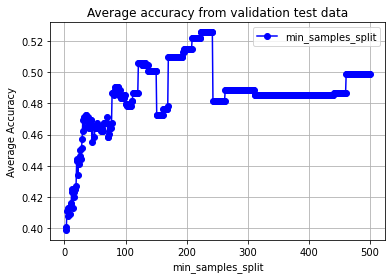

Best min_samples_split from validation test data is: 223


In [12]:
min_samples_split_values = [i for i in range(2,501)]
min_samples_split_list = []
average_accuracy_values = []

for k in min_samples_split_values:
    accuracy_values_for_min_samples_split_list = []
    for number_simulation in range(10):
        X_validate, X_test_validate, y_validate, y_test_validate = train_test_split(X_train, y_train, train_size=0.8, test_size=0.2, random_state=42)
        model_DT = DT(X_validate, y_validate, X_test_validate, y_test_validate, min_samples_split=k, min_samples_leaf=1)
        accuracy = model_DT.build_and_train_model()
        accuracy_values_for_min_samples_split_list.append(accuracy)
    average_accuracy = np.mean(accuracy_values_for_min_samples_split_list)
    min_samples_split_list.append(k)
    average_accuracy_values.append(average_accuracy)

plt.plot(min_samples_split_list, average_accuracy_values, 'bo-', label='min_samples_split')
plt.title('Average accuracy from validation test data')
plt.xlabel('min_samples_split')
plt.ylabel('Average Accuracy')
plt.grid(True)
plt.legend()
plt.show()

best_min_samples_split = min_samples_split_list[np.argmax(average_accuracy_values)]
print(f"Best min_samples_split from validation test data is: {best_min_samples_split}")




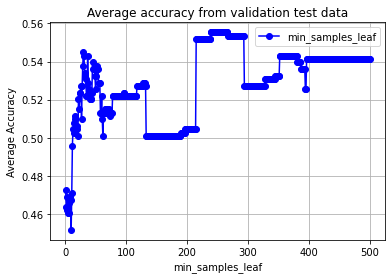

Best min_samples_leaf from validation test data is: 239


In [13]:
min_samples_leaf_values = [i for i in range(1,501)]
min_samples_leaf_list = []
average_accuracy_values = []

for k in min_samples_leaf_values:
    accuracy_values_for_min_samples_leaf_list = []
    for number_simulation in range(10):
        X_validate, X_test_validate, y_validate, y_test_validate = train_test_split(X_train, y_train, train_size=0.8, test_size=0.2, random_state=42)
        model_DT = DT(X_validate, y_validate, X_test_validate, y_test_validate, min_samples_split=35, min_samples_leaf=k)
        accuracy = model_DT.build_and_train_model()
        accuracy_values_for_min_samples_leaf_list.append(accuracy)
    average_accuracy = np.mean(accuracy_values_for_min_samples_leaf_list)
    min_samples_leaf_list.append(k)
    average_accuracy_values.append(average_accuracy)

plt.plot(min_samples_leaf_list, average_accuracy_values, 'bo-', label='min_samples_leaf')
plt.title('Average accuracy from validation test data')
plt.xlabel('min_samples_leaf')
plt.ylabel('Average Accuracy')
plt.grid(True)
plt.legend()
plt.show()

best_min_samples_leaf = min_samples_leaf_list[np.argmax(average_accuracy_values)]
print(f"Best min_samples_leaf from validation test data is: {best_min_samples_leaf}")




No handles with labels found to put in legend.


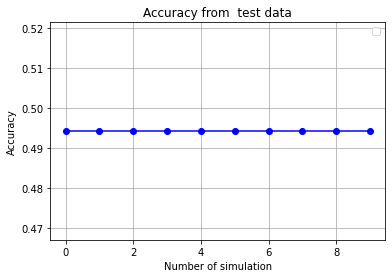

accuracy:0.49415204678362573


In [14]:
number_simulation_values = []
accuracy_values = []

for number_simulation in range(10):
    model_DT = DT(X_train, y_train, X_test, y_test, min_samples_split=223, min_samples_leaf=239)
    accuracy = model_DT.build_and_train_model()
    number_simulation_values.append(number_simulation)
    accuracy_values.append(accuracy)

plt.plot(number_simulation_values, accuracy_values, 'bo-')
plt.title('Accuracy from  test data')
plt.xlabel('Number of simulation')
plt.ylabel('Accuracy')
plt.grid(True)
plt.legend()
plt.show()
print(f'accuracy:{accuracy}')

# Random forest

In [23]:
class RF:
    def __init__(self, X_train, y_train, X_test, y_test, n_estimators, min_samples_split, min_samples_leaf):
        self.X_train = X_train
        self.y_train = y_train
        self.X_test = X_test
        self.y_test = y_test
        self.n_estimators = n_estimators
        self.min_samples_split = min_samples_split
        self.min_samples_leaf = min_samples_leaf

    def build_and_train_model(self):
        X_train = self.X_train
        y_train = self.y_train
        X_test = self.X_test
        y_test = self.y_test
        model = RandomForestClassifier(random_state=42, n_estimators=self.n_estimators, min_samples_split=self.min_samples_split, min_samples_leaf=self.min_samples_leaf)
        model.fit(X_train, y_train)
        accuracy = model.score(X_test, y_test)
        return accuracy

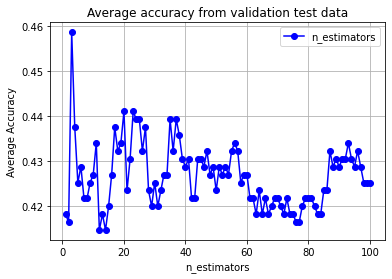

Best n_estimators from validation test data is: 3


In [24]:
n_estimators_values = [i for i in range(1,101)]
n_estimators_list = []
average_accuracy_values = []

for k in n_estimators_values:
    accuracy_values_for_n_estimators_list = []
    for number_simulation in range(10):
        X_validate, X_test_validate, y_validate, y_test_validate = train_test_split(X_train, y_train, train_size=0.8, test_size=0.2, random_state=42)
        model_RF = RF(X_validate, y_validate, X_test_validate, y_test_validate, n_estimators=k, min_samples_split=2, min_samples_leaf=1)
        accuracy = model_RF.build_and_train_model()
        accuracy_values_for_n_estimators_list.append(accuracy)
    average_accuracy = np.mean(accuracy_values_for_n_estimators_list)
    n_estimators_list.append(k)
    average_accuracy_values.append(average_accuracy)

plt.plot(n_estimators_list, average_accuracy_values, 'bo-', label='n_estimators')
plt.title('Average accuracy from validation test data')
plt.xlabel('n_estimators')
plt.ylabel('Average Accuracy')
plt.grid(True)
plt.legend()
plt.show()

best_n_estimators = n_estimators_list[np.argmax(average_accuracy_values)]
print(f"Best n_estimators from validation test data is: {best_n_estimators}")

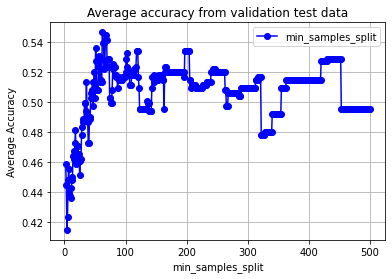

Best min_samples_split from validation test data is: 62


In [27]:
min_samples_split_values = [i for i in range(2,501)]
min_samples_split_list = []
average_accuracy_values = []

for k in min_samples_split_values:
    accuracy_values_for_min_samples_split_list = []
    for number_simulation in range(10):
        X_validate, X_test_validate, y_validate, y_test_validate = train_test_split(X_train, y_train, train_size=0.8, test_size=0.2, random_state=42)
        model_RF = RF(X_validate, y_validate, X_test_validate, y_test_validate, n_estimators=3, min_samples_split=k, min_samples_leaf=1)
        accuracy = model_RF.build_and_train_model()
        accuracy_values_for_min_samples_split_list.append(accuracy)
    average_accuracy = np.mean(accuracy_values_for_min_samples_split_list)
    min_samples_split_list.append(k)
    average_accuracy_values.append(average_accuracy)

plt.plot(min_samples_split_list, average_accuracy_values, 'bo-', label='min_samples_split')
plt.title('Average accuracy from validation test data')
plt.xlabel('min_samples_split')
plt.ylabel('Average Accuracy')
plt.grid(True)
plt.legend()
plt.show()

best_min_samples_split = min_samples_split_list[np.argmax(average_accuracy_values)]
print(f"Best min_samples_split from validation test data is: {best_min_samples_split}")

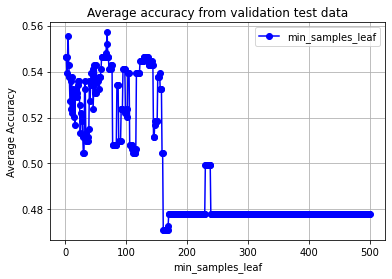

Best min_samples_leaf from validation test data is: 69


In [28]:
min_samples_leaf_values = [i for i in range(1,501)]
min_samples_leaf_list = []
average_accuracy_values = []

for k in min_samples_leaf_values:
    accuracy_values_for_min_samples_leaf_list = []
    for number_simulation in range(10):
        X_validate, X_test_validate, y_validate, y_test_validate = train_test_split(X_train, y_train, train_size=0.8, test_size=0.2, random_state=42)
        model_RF = RF(X_validate, y_validate, X_test_validate, y_test_validate, n_estimators=3, min_samples_split=62, min_samples_leaf=k)
        accuracy = model_RF.build_and_train_model()
        accuracy_values_for_min_samples_leaf_list.append(accuracy)
    average_accuracy = np.mean(accuracy_values_for_min_samples_leaf_list)
    min_samples_leaf_list.append(k)
    average_accuracy_values.append(average_accuracy)

plt.plot(min_samples_leaf_list, average_accuracy_values, 'bo-', label='min_samples_leaf')
plt.title('Average accuracy from validation test data')
plt.xlabel('min_samples_leaf')
plt.ylabel('Average Accuracy')
plt.grid(True)
plt.legend()
plt.show()

best_min_samples_leaf = min_samples_leaf_list[np.argmax(average_accuracy_values)]
print(f"Best min_samples_leaf from validation test data is: {best_min_samples_leaf}")

No handles with labels found to put in legend.


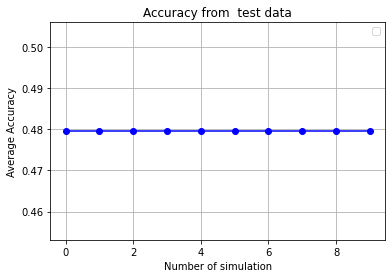

accuracy:0.47953216374269003


In [30]:
number_simulation_values = []
accuracy_values = []

for number_simulation in range(10):
    model_RF = RF(X_train, y_train, X_test, y_test, n_estimators=3, min_samples_split=62, min_samples_leaf=69)
    accuracy = model_RF.build_and_train_model()
    number_simulation_values.append(number_simulation)
    accuracy_values.append(accuracy)

plt.plot(number_simulation_values, accuracy_values, 'bo-')
plt.title('Accuracy from  test data')
plt.xlabel('Number of simulation')
plt.ylabel('Average Accuracy')
plt.grid(True)
plt.legend()
plt.show()
print(f'accuracy:{accuracy}')

# bagging

In [7]:
class Bagging:
    def __init__(self, X_train, y_train, X_test, y_test, base_model, n_estimators):
        self.X_train = X_train
        self.y_train = y_train
        self.X_test = X_test
        self.y_test = y_test
        self.base_model = base_model
        self.n_estimators = n_estimators

    def build_and_train_model(self):
        X_train = self.X_train
        y_train = self.y_train
        X_test = self.X_test
        y_test = self.y_test
        base_model = self.base_model
        if model_type == 'knn':
            base_model = KNeighborsClassifier(n_neighbors=183)
        elif model_type == 'logistic_regression':
            base_model = LogisticRegression(random_state=42)              
        elif model_type == 'naive_bayes':
            base_model = MultinomialNB()
        elif model_type == 'svm':
            base_model = SVC(C=1000)
        elif model_type == 'classification_tree':
            base_model = DecisionTreeClassifier(random_state=42, min_samples_split=223, min_samples_leaf=239)
        elif model_type == 'random_forest':
            base_model = RandomForestClassifier(random_state=42, n_estimators=3, min_samples_split=62, min_samples_leaf=69)
        else:
            raise ValueError("Invalid model type. Choose 'knn', 'logistic_regression', 'naive_bayes', 'svm', 'classification_tree' or 'random_forest'.")
        model = BaggingClassifier(base_model, random_state=42, n_estimators=self.n_estimators)
        model.fit(X_train, y_train)
        accuracy = model.score(X_test, y_test)
        return accuracy

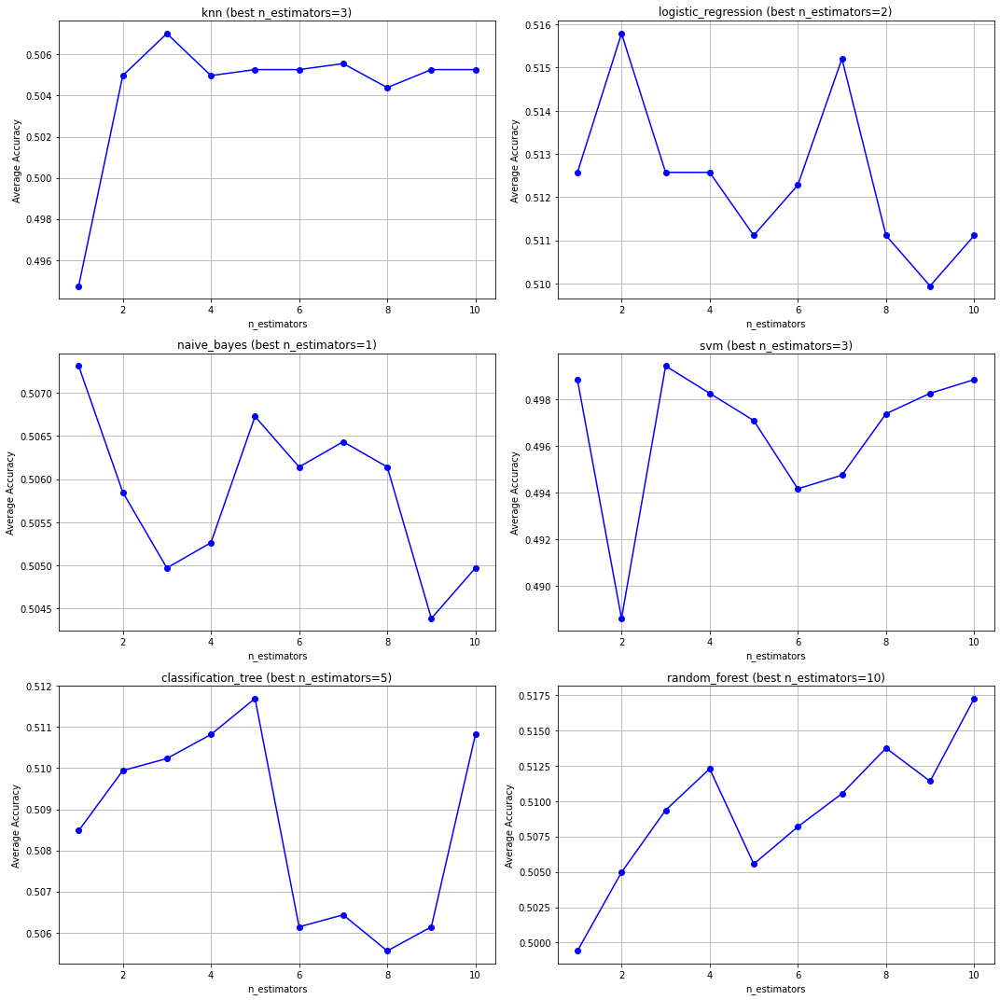

In [34]:
models = {
    'knn': KNeighborsClassifier(n_neighbors=183),
    'logistic_regression': LogisticRegression(random_state=42),
    'naive_bayes': MultinomialNB(),
    'svm': SVC(C=1000),
    'classification_tree': DecisionTreeClassifier(random_state=42, min_samples_split=223, min_samples_leaf=239),
    'random_forest': RandomForestClassifier(random_state=42, n_estimators=3, min_samples_split=62, min_samples_leaf=69)
}

fig, axs = plt.subplots(3, 2, figsize=(15, 15))

for i, (model_type, base_model) in enumerate(models.items()):
    row = i // 2
    col = i % 2
    ax = axs[row, col]

    n_estimators_values = range(1, 11)
    average_accuracy_values = []
    best_n_estimators_list = []

    for n_estimators in n_estimators_values:
        accuracy_values_for_n_estimators_list = []      
        for i in range(10):
            X_validate, X_test_validate, y_validate, y_test_validate = train_test_split(X_train, y_train, train_size=0.8, test_size=0.2)
            bagging_model = BaggingClassifier(base_model, n_estimators=n_estimators)
            bagging_model.fit(X_train, y_train)
            accuracy = bagging_model.score(X_test, y_test)
            accuracy_values_for_n_estimators_list.append(accuracy)
        average_accuracy = np.mean(accuracy_values_for_n_estimators_list)
        average_accuracy_values.append(average_accuracy)
        best_n_estimators = n_estimators_values[np.argmax(average_accuracy_values)]
        best_n_estimators_list.append(best_n_estimators)

    ax.plot(n_estimators_values, average_accuracy_values, 'bo-')
    ax.set_title(model_type + f" (best n_estimators={best_n_estimators_list[-1]})")
    ax.set_xlabel('n_estimators')
    ax.set_ylabel('Average Accuracy')
    ax.grid(True)

plt.tight_layout()
plt.show()

accuracy:[0.5146198830409356, 0.49415204678362573, 0.5, 0.5058479532163743, 0.49415204678362573, 0.49707602339181284, 0.49707602339181284, 0.5116959064327485, 0.5175438596491229, 0.5087719298245614] for model: knn
accuracy:[0.52046783625731, 0.5233918128654971, 0.5087719298245614, 0.5058479532163743, 0.5087719298245614, 0.5087719298245614, 0.5087719298245614, 0.5175438596491229, 0.5087719298245614, 0.5087719298245614] for model: logistic_regression
accuracy:[0.5058479532163743, 0.5029239766081871, 0.5058479532163743, 0.5058479532163743, 0.5029239766081871, 0.5058479532163743, 0.5058479532163743, 0.5029239766081871, 0.5058479532163743, 0.5029239766081871] for model: naive_bayes
accuracy:[0.5, 0.49122807017543857, 0.49122807017543857, 0.49122807017543857, 0.5, 0.4824561403508772, 0.5029239766081871, 0.5058479532163743, 0.5, 0.4853801169590643] for model: svm
accuracy:[0.5116959064327485, 0.5116959064327485, 0.5058479532163743, 0.49415204678362573, 0.5029239766081871, 0.5146198830409356, 

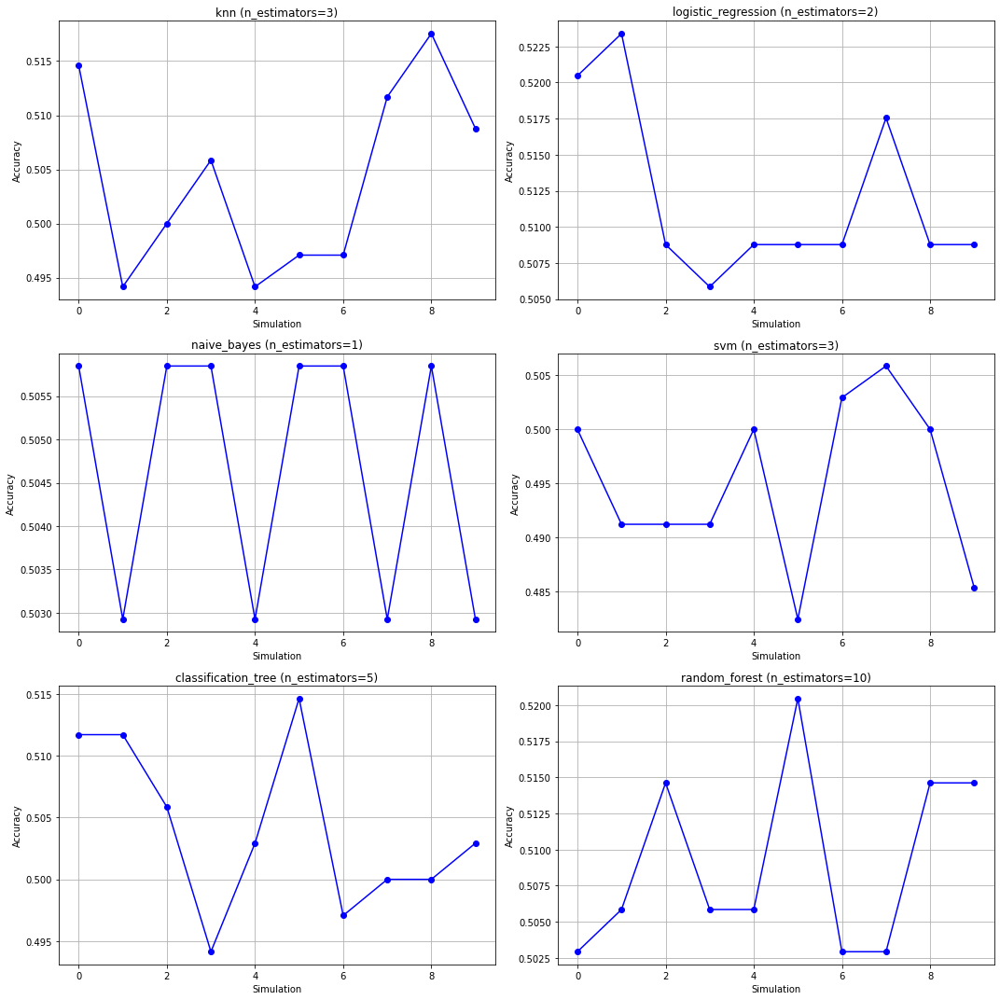

In [35]:
models = {
    'knn': (KNeighborsClassifier(n_neighbors=183), 3),
    'logistic_regression': (LogisticRegression(random_state=42), 2),
    'naive_bayes': (MultinomialNB(), 1),
    'svm': (SVC(C=1000), 3),
    'classification_tree': (DecisionTreeClassifier(random_state=42, min_samples_split=223, min_samples_leaf=239), 5),
    'random_forest': (RandomForestClassifier(random_state=42, n_estimators=3, min_samples_split=62, min_samples_leaf=69), 10)
}

fig, axs = plt.subplots(3, 2, figsize=(15, 15))

for i, (model_type, (base_model, n_estimators)) in enumerate(models.items()):
    row = i // 2
    col = i % 2
    ax = axs[row, col]
    accuracy_values_for_n_simulations_list = []
    number_simulations_list = []
    for j in range(10):
        X_validate, X_test_validate, y_validate, y_test_validate = train_test_split(X_train, y_train, train_size=0.8, test_size=0.2)
        bagging_model = BaggingClassifier(base_model, n_estimators=n_estimators)
        bagging_model.fit(X_train, y_train)
        accuracy = bagging_model.score(X_test, y_test)
        number_simulations_list.append(j)
        accuracy_values_for_n_simulations_list.append(accuracy)
    print(f'accuracy:{accuracy_values_for_n_simulations_list} for model: {model_type}')
    ax.plot(number_simulations_list, accuracy_values_for_n_simulations_list, 'bo-')
    ax.set_title(model_type + f" (n_estimators={n_estimators})")
    ax.set_xlabel('Simulation')
    ax.set_ylabel('Accuracy')
    ax.grid(True)

plt.tight_layout()
plt.show()



# boosting

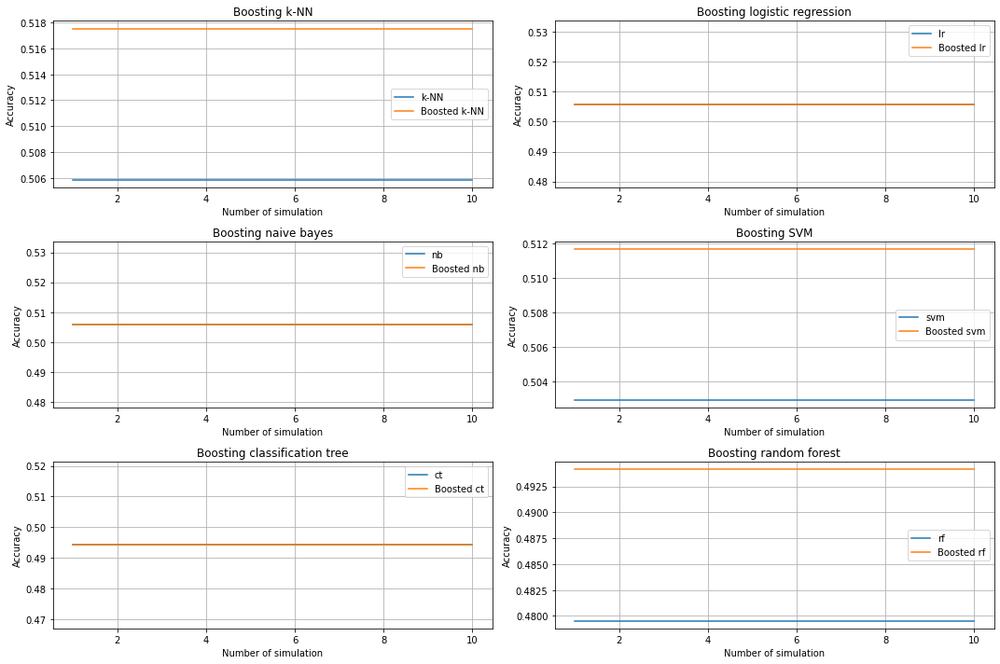

In [49]:
parameters = {
    'objective': 'multi:softmax',
    'num_class': len(set(y_train))
}


knn_accuracies = []
xgb_accuracies_00 = []
lr_accuracies = []
xgb_accuracies_01 = []
nb_accuracies = []
xgb_accuracies_10 = []
svm_accuracies = []
xgb_accuracies_11 = []
ct_accuracies = []
xgb_accuracies_20 = []
rf_accuracies = []
xgb_accuracies_21 = []


for j in range(10):
    knn_model = KNeighborsClassifier(n_neighbors=183)
    knn_model.fit(X_train, y_train)
    knn_predictions = knn_model.predict(X_test)
    knn_accuracy = accuracy_score(y_test, knn_predictions)
    knn_accuracies.append(knn_accuracy)

    xgb_model_knn = xgb.train(parameters, xgb.DMatrix(knn_predictions.reshape(-1, 1), label=y_test), num_boost_round=3)
    dtest_knn = xgb.DMatrix(knn_model.predict(X_test).reshape(-1, 1), label=y_test)
    xgb_predictions_knn = xgb_model_knn.predict(dtest_knn)
    xgb_accuracy_knn = accuracy_score(y_test, xgb_predictions_knn)
    xgb_accuracies_00.append(xgb_accuracy_knn)

    lr_model = LogisticRegression()
    lr_model.fit(X_train, y_train)
    lr_predictions = lr_model.predict(X_test)
    lr_accuracy = accuracy_score(y_test, lr_predictions)
    lr_accuracies.append(lr_accuracy)

    xgb_model_lr = xgb.train(parameters, xgb.DMatrix(lr_predictions.reshape(-1, 1), label=y_test), num_boost_round=3)
    dtest_lr = xgb.DMatrix(lr_model.predict(X_test).reshape(-1, 1), label=y_test)
    xgb_predictions_lr = xgb_model_lr.predict(dtest_lr)
    xgb_accuracy_lr = accuracy_score(y_test, xgb_predictions_lr)
    xgb_accuracies_01.append(xgb_accuracy_lr) 

    nb_model = MultinomialNB()
    nb_model.fit(X_train, y_train)
    nb_predictions = nb_model.predict(X_test)
    nb_accuracy = accuracy_score(y_test, nb_predictions)
    nb_accuracies.append(nb_accuracy)

    xgb_model_nb = xgb.train(parameters, xgb.DMatrix(nb_predictions.reshape(-1, 1), label=y_test), num_boost_round=3)
    dtest_nb = xgb.DMatrix(nb_model.predict(X_test).reshape(-1, 1), label=y_test)
    xgb_predictions_nb = xgb_model_nb.predict(dtest_nb)
    xgb_accuracy_nb = accuracy_score(y_test, xgb_predictions_nb)
    xgb_accuracies_10.append(xgb_accuracy_nb) 

    svm_model = SVC(C=1000)
    svm_model.fit(X_train, y_train)
    svm_predictions = svm_model.predict(X_test)
    svm_accuracy = accuracy_score(y_test, svm_predictions)
    svm_accuracies.append(svm_accuracy)

    xgb_model_svm = xgb.train(parameters, xgb.DMatrix(svm_predictions.reshape(-1, 1), label=y_test), num_boost_round=3)
    dtest_svm = xgb.DMatrix(svm_model.predict(X_test).reshape(-1, 1), label=y_test)
    xgb_predictions_svm = xgb_model_svm.predict(dtest_svm)
    xgb_accuracy_svm = accuracy_score(y_test, xgb_predictions_svm)
    xgb_accuracies_11.append(xgb_accuracy_svm)

    ct_model = DecisionTreeClassifier(random_state=42, min_samples_split=223, min_samples_leaf=239)
    ct_model.fit(X_train, y_train)
    ct_predictions = ct_model.predict(X_test)
    ct_accuracy = accuracy_score(y_test, ct_predictions)
    ct_accuracies.append(ct_accuracy)

    xgb_model_ct = xgb.train(parameters, xgb.DMatrix(ct_predictions.reshape(-1, 1), label=y_test), num_boost_round=3)
    dtest_ct = xgb.DMatrix(ct_model.predict(X_test).reshape(-1, 1), label=y_test)
    xgb_predictions_ct = xgb_model_svm.predict(dtest_ct)
    xgb_accuracy_ct = accuracy_score(y_test, xgb_predictions_ct)
    xgb_accuracies_20.append(xgb_accuracy_ct)

    rf_model = RandomForestClassifier(random_state=42, n_estimators=3, min_samples_split=62, min_samples_leaf=69)
    rf_model.fit(X_train, y_train)
    rf_predictions = rf_model.predict(X_test)
    rf_accuracy = accuracy_score(y_test, rf_predictions)
    rf_accuracies.append(rf_accuracy)

    xgb_model_rf = xgb.train(parameters, xgb.DMatrix(ct_predictions.reshape(-1, 1), label=y_test), num_boost_round=3)
    dtest_rf = xgb.DMatrix(ct_model.predict(X_test).reshape(-1, 1), label=y_test)
    xgb_predictions_rf = xgb_model_svm.predict(dtest_rf)
    xgb_accuracy_rf = accuracy_score(y_test, xgb_predictions_rf)
    xgb_accuracies_21.append(xgb_accuracy_rf)
        
fig, axes = plt.subplots(3, 2, figsize=(15, 10))

axes[0, 0].plot(range(1,11), knn_accuracies, label='k-NN')
axes[0, 0].plot(range(1,11), xgb_accuracies_00, label='Boosted k-NN')
axes[0, 0].set_title('Boosting k-NN')
axes[0, 0].set_xlabel('Number of simulation')
axes[0, 0].set_ylabel('Accuracy')
axes[0, 0].legend()
axes[0, 0].grid(True)

axes[0, 1].plot(range(1,11), lr_accuracies, label='lr')
axes[0, 1].plot(range(1,11), xgb_accuracies_01, label='Boosted lr')
axes[0, 1].set_title('Boosting logistic regression')
axes[0, 1].set_xlabel('Number of simulation')
axes[0, 1].set_ylabel('Accuracy')
axes[0, 1].legend()
axes[0, 1].grid(True)

axes[1, 0].plot(range(1,11), nb_accuracies, label='nb')
axes[1, 0].plot(range(1,11), xgb_accuracies_10, label='Boosted nb')
axes[1, 0].set_title('Boosting naive bayes')
axes[1, 0].set_xlabel('Number of simulation')
axes[1, 0].set_ylabel('Accuracy')
axes[1, 0].legend()
axes[1, 0].grid(True)

axes[1, 1].plot(range(1,11), svm_accuracies, label='svm')
axes[1, 1].plot(range(1,11), xgb_accuracies_11, label='Boosted svm')
axes[1, 1].set_title('Boosting SVM')
axes[1, 1].set_xlabel('Number of simulation')
axes[1, 1].set_ylabel('Accuracy')
axes[1, 1].legend()
axes[1, 1].grid(True)

axes[2, 0].plot(range(1,11), ct_accuracies, label='ct')
axes[2, 0].plot(range(1,11), xgb_accuracies_20, label='Boosted ct')
axes[2, 0].set_title('Boosting classification tree')
axes[2, 0].set_xlabel('Number of simulation')
axes[2, 0].set_ylabel('Accuracy')
axes[2, 0].legend()
axes[2, 0].grid(True)

axes[2, 1].plot(range(1,11), rf_accuracies, label='rf')
axes[2, 1].plot(range(1,11), xgb_accuracies_21, label='Boosted rf')
axes[2, 1].set_title('Boosting random forest')
axes[2, 1].set_xlabel('Number of simulation')
axes[2, 1].set_ylabel('Accuracy')
axes[2, 1].legend()
axes[2, 1].grid(True)

plt.tight_layout()
plt.show()

# Neural network

Epoch 1/10
72/72 [==============================] - 1s 2ms/step - loss: 2.1487 - accuracy: 0.2581
Epoch 2/10
72/72 [==============================] - 0s 2ms/step - loss: 1.9564 - accuracy: 0.2665
Epoch 3/10
72/72 [==============================] - 0s 2ms/step - loss: 1.8558 - accuracy: 0.2894
Epoch 4/10
72/72 [==============================] - 0s 2ms/step - loss: 1.7752 - accuracy: 0.3135
Epoch 5/10
72/72 [==============================] - 0s 2ms/step - loss: 1.7174 - accuracy: 0.3795
Epoch 6/10
72/72 [==============================] - 0s 2ms/step - loss: 1.6784 - accuracy: 0.4138
Epoch 7/10
72/72 [==============================] - 0s 2ms/step - loss: 1.6432 - accuracy: 0.4270
Epoch 8/10
72/72 [==============================] - 0s 2ms/step - loss: 1.6140 - accuracy: 0.4424
Epoch 9/10
72/72 [==============================] - 0s 2ms/step - loss: 1.5924 - accuracy: 0.4411
Epoch 10/10
18/18 [==============================] - 0s 1ms/step - loss: 1.5318 - accuracy: 0.4657
Epoch 1/10
72/72 [=

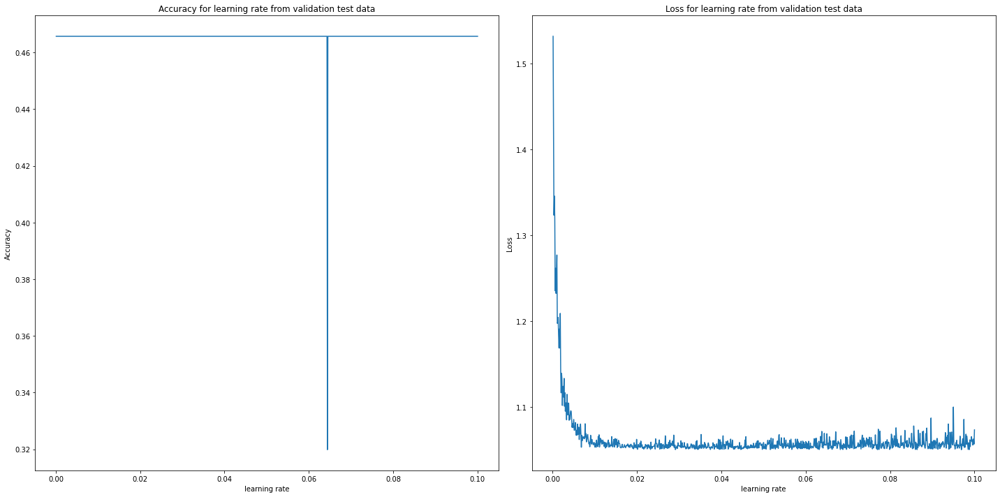

Best learning_rate: 0.0969
Best loss: 1.0506895780563354
Best accuracy: 0.46572935581207275


In [59]:
X_validate = np.array(X_validate)
X_test_validate = np.array(X_test_validate)
y_validate_categorical = to_categorical(y_validate)
y_test_validate_categorical = to_categorical(y_test_validate)

custom_lr = [i/10000 for i in range(1, 1001)]
loss_list = []
accuracy_list = []

for j in custom_lr:
    model = Sequential()
    model.add(Dense(64, activation='relu', input_shape=(X_validate.shape[1],), kernel_regularizer=regularizers.l2(0.01)))
    model.add(Dropout(0.05))
    model.add(Dense(32, activation='tanh', kernel_regularizer=regularizers.l2(0.01)))
    model.add(Dropout(0.02))
    model.add(Dense(16, activation='relu', kernel_regularizer=regularizers.l2(0.01)))
    model.add(Dropout(0.2))
    model.add(Dense(3, activation='softmax', kernel_regularizer=regularizers.l2(0.01)))

    optimizer = Adam(learning_rate=j)

    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    model.fit(X_validate, y_validate_categorical, epochs=10)

    model_score = model.evaluate(X_test_validate, y_test_validate_categorical)
    loss_list.append(model_score[0])
    accuracy_list.append(model_score[1])

fig, axes = plt.subplots(1,2, figsize=(20,10))
axes[0].plot(custom_lr, accuracy_list)
axes[0].set_title('Accuracy for learning rate from validation test data')
axes[0].set_xlabel('learning rate')
axes[0].set_ylabel('Accuracy')

axes[1].plot(custom_lr, loss_list)
axes[1].set_title('Loss for learning rate from validation test data')
axes[1].set_xlabel('learning rate')
axes[1].set_ylabel('Loss')

plt.tight_layout()
plt.show() 

full_custom_lr = list(zip(loss_list, accuracy_list))
full_custom_lr = np.array(full_custom_lr) 

best_accuracy_indices = np.where(full_custom_lr[:, 1] == max(accuracy_list))[0]
best_loss_index = np.argmin(full_custom_lr[best_accuracy_indices, 0])
best_index = best_accuracy_indices[best_loss_index]
best_loss = full_custom_lr[best_index, 0]
best_accuracy = full_custom_lr[best_index, 1]
best_learning_rate = custom_lr[best_index]
print(f'Best learning_rate: {best_learning_rate}')
print(f'Best loss: {best_loss}')
print(f'Best accuracy: {best_accuracy}')


Epoch 1/10
72/72 [==============================] - 1s 2ms/step - loss: 1.0965 - accuracy: 0.4595
Epoch 2/10
72/72 [==============================] - 0s 2ms/step - loss: 1.1071 - accuracy: 0.4758
Epoch 3/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0547 - accuracy: 0.4789
Epoch 4/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0540 - accuracy: 0.4789
Epoch 5/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0524 - accuracy: 0.4789
Epoch 6/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0596 - accuracy: 0.4789
Epoch 7/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0553 - accuracy: 0.4789
Epoch 8/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0603 - accuracy: 0.4675
Epoch 9/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0554 - accuracy: 0.4789
Epoch 10/10
18/18 [==============================] - 0s 2ms/step - loss: 1.0549 - accuracy: 0.4657
Epoch 1/10
72/72 [=

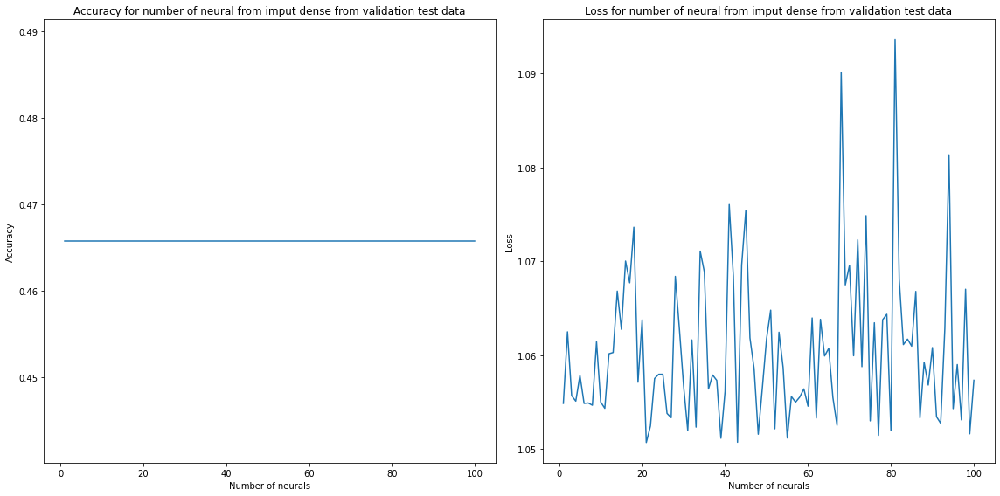

Best Number of neurons: 21
Best loss: 1.0507128238677979
Best accuracy: 0.46572935581207275


In [71]:
layer1_neuron = [i for i in range(1, 101)]
loss_list = []
accuracy_list = []

for j in layer1_neuron:
    model = Sequential()
    model.add(Dense(j, activation='relu', input_shape=(X_validate.shape[1],), kernel_regularizer=regularizers.l2(0.01)))
    model.add(Dropout(0.05))
    model.add(Dense(32, activation='tanh', kernel_regularizer=regularizers.l2(0.01)))
    model.add(Dropout(0.02))
    model.add(Dense(16, activation='relu', kernel_regularizer=regularizers.l2(0.01)))
    model.add(Dropout(0.2))
    model.add(Dense(3, activation='softmax', kernel_regularizer=regularizers.l2(0.01)))

    optimizer = Adam(learning_rate=0.0969)

    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    model.fit(X_validate, y_validate_categorical, epochs=10)

    model_score = model.evaluate(X_test_validate, y_test_validate_categorical)
    loss_list.append(model_score[0])
    accuracy_list.append(model_score[1])

fig, axes = plt.subplots(1,2, figsize=(16,8))
axes[0].plot(layer1_neuron, accuracy_list)
axes[0].set_title('Accuracy for number of neural from imput dense from validation test data')
axes[0].set_xlabel('Number of neurals')
axes[0].set_ylabel('Accuracy')

axes[1].plot(layer1_neuron, loss_list)
axes[1].set_title('Loss for number of neural from imput dense from validation test data')
axes[1].set_xlabel('Number of neurals')
axes[1].set_ylabel('Loss')

plt.tight_layout()
plt.savefig('NN2.jpg')
plt.show()

full_layer1_neuron = list(zip(loss_list, accuracy_list))
full_layer1_neuron = np.array(full_layer1_neuron) 

best_accuracy_indices = np.where(full_layer1_neuron[:, 1] == max(accuracy_list))[0]
best_loss_index = np.argmin(full_layer1_neuron[best_accuracy_indices, 0])
best_index = best_accuracy_indices[best_loss_index]
best_loss = full_layer1_neuron[best_index, 0]
best_accuracy = full_layer1_neuron[best_index, 1]
best_number_neuron = layer1_neuron[best_index]
print(f'Best Number of neurons: {best_number_neuron}')
print(f'Best loss: {best_loss}')
print(f'Best accuracy: {best_accuracy}')


Epoch 1/10
72/72 [==============================] - 1s 2ms/step - loss: 1.3628 - accuracy: 0.4604
Epoch 2/10
72/72 [==============================] - 0s 2ms/step - loss: 1.1665 - accuracy: 0.4688
Epoch 3/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0843 - accuracy: 0.4789
Epoch 4/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0699 - accuracy: 0.4789
Epoch 5/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0602 - accuracy: 0.4789
Epoch 6/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0567 - accuracy: 0.4789
Epoch 7/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0576 - accuracy: 0.4789
Epoch 8/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0544 - accuracy: 0.4789
Epoch 9/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0524 - accuracy: 0.4789
Epoch 10/10
18/18 [==============================] - 0s 1ms/step - loss: 1.0531 - accuracy: 0.4657
Epoch 1/10
72/72 [=

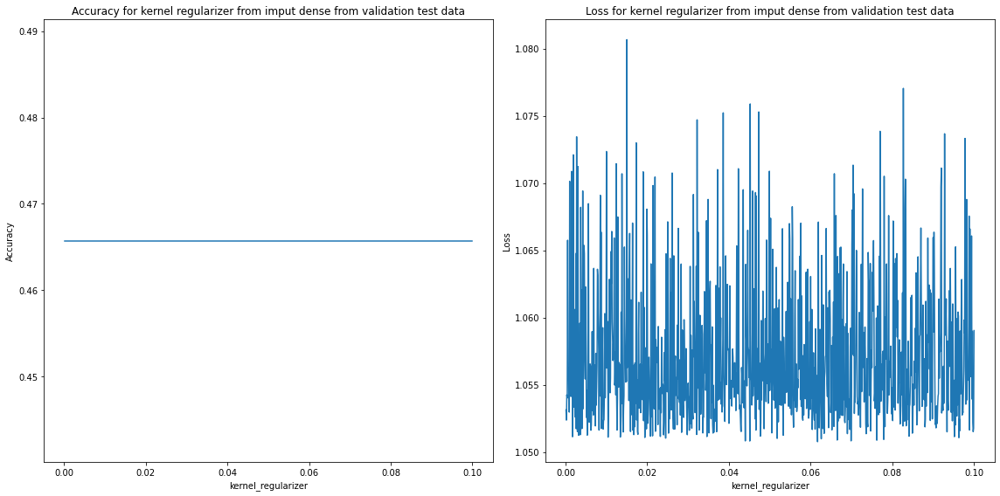

Best kernel_regularizer: 0.0617
Best loss: 1.0507608652114868
Best accuracy: 0.46572935581207275


In [72]:
kernel_regularizer_list = [i/10000 for i in range(1, 1001)]
loss_list = []
accuracy_list = []

for j in kernel_regularizer_list:
    model = Sequential()
    model.add(Dense(21, activation='relu', input_shape=(X_validate.shape[1],), kernel_regularizer=regularizers.l2(j)))
    model.add(Dropout(0.05))
    model.add(Dense(32, activation='tanh', kernel_regularizer=regularizers.l2(0.01)))
    model.add(Dropout(0.02))
    model.add(Dense(16, activation='relu', kernel_regularizer=regularizers.l2(0.01)))
    model.add(Dropout(0.2))
    model.add(Dense(3, activation='softmax', kernel_regularizer=regularizers.l2(0.01)))

    optimizer = Adam(learning_rate=0.0727)

    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    model.fit(X_validate, y_validate_categorical, epochs=10)

    model_score = model.evaluate(X_test_validate, y_test_validate_categorical)
    loss_list.append(model_score[0])
    accuracy_list.append(model_score[1])

fig, axes = plt.subplots(1,2, figsize=(16,8))
axes[0].plot(kernel_regularizer_list, accuracy_list)
axes[0].set_title('Accuracy for kernel regularizer from imput dense from validation test data')
axes[0].set_xlabel('kernel_regularizer')
axes[0].set_ylabel('Accuracy')

axes[1].plot(kernel_regularizer_list, loss_list)
axes[1].set_title('Loss for kernel regularizer from imput dense from validation test data')
axes[1].set_xlabel('kernel_regularizer')
axes[1].set_ylabel('Loss')

plt.tight_layout()
plt.savefig('NN3.jpg')
plt.show() 

full_kernel_regularizer_list = list(zip(loss_list, accuracy_list))
full_kernel_regularizer_list = np.array(full_kernel_regularizer_list) 

best_accuracy_indices = np.where(full_kernel_regularizer_list[:, 1] == max(accuracy_list))[0]
best_loss_index = np.argmin(full_kernel_regularizer_list[best_accuracy_indices, 0])
best_index = best_accuracy_indices[best_loss_index]
best_loss = full_kernel_regularizer_list[best_index, 0]
best_accuracy = full_kernel_regularizer_list[best_index, 1]
best_kernel_regularizer = kernel_regularizer_list[best_index]
print(f'Best kernel_regularizer: {best_kernel_regularizer}')
print(f'Best loss: {best_loss}')
print(f'Best accuracy: {best_accuracy}')


Epoch 1/10
72/72 [==============================] - 1s 2ms/step - loss: 1.4922 - accuracy: 0.4661
Epoch 2/10
72/72 [==============================] - 0s 2ms/step - loss: 1.1151 - accuracy: 0.4789
Epoch 3/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0747 - accuracy: 0.4692
Epoch 4/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0641 - accuracy: 0.4789
Epoch 5/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0613 - accuracy: 0.4789
Epoch 6/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0591 - accuracy: 0.4789
Epoch 7/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0590 - accuracy: 0.4789
Epoch 8/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0561 - accuracy: 0.4789
Epoch 9/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0542 - accuracy: 0.4789
Epoch 10/10
18/18 [==============================] - 0s 2ms/step - loss: 1.0573 - accuracy: 0.4657
Epoch 1/10
72/72 [=

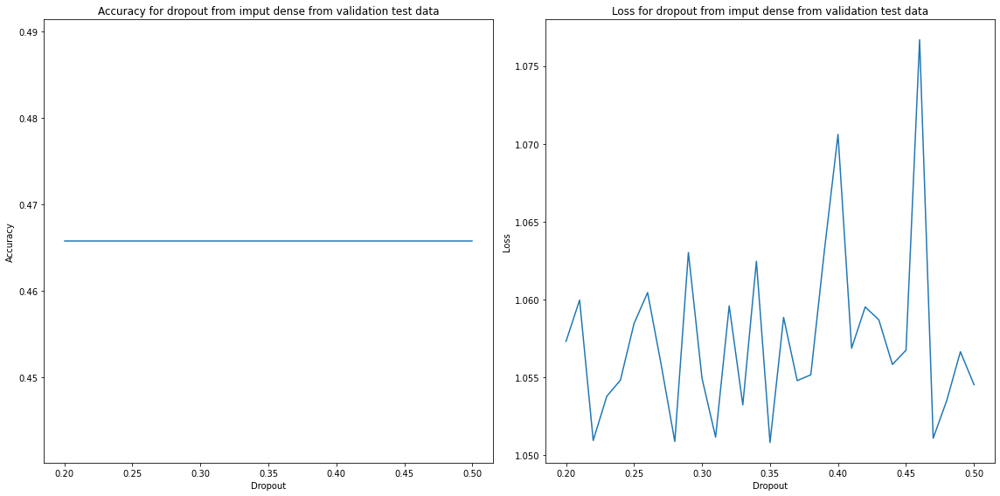

Best Dropout: 0.35
Best loss: 1.0508185625076294
Best accuracy: 0.46572935581207275


In [73]:
Dropout_list = [i/100 for i in range(20, 51)]
loss_list = []
accuracy_list = []

for j in Dropout_list:
    model = Sequential()
    model.add(Dense(21, activation='relu', input_shape=(X_validate.shape[1],), kernel_regularizer=regularizers.l2(0.0617)))
    model.add(Dropout(j))
    model.add(Dense(32, activation='tanh', kernel_regularizer=regularizers.l2(0.01)))
    model.add(Dropout(0.02))
    model.add(Dense(16, activation='relu', kernel_regularizer=regularizers.l2(0.01)))
    model.add(Dropout(0.2))
    model.add(Dense(3, activation='softmax', kernel_regularizer=regularizers.l2(0.01)))

    optimizer = Adam(learning_rate=0.0727)

    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    model.fit(X_validate, y_validate_categorical, epochs=10)

    model_score = model.evaluate(X_test_validate, y_test_validate_categorical)
    loss_list.append(model_score[0])
    accuracy_list.append(model_score[1])

fig, axes = plt.subplots(1,2, figsize=(16,8))
axes[0].plot(Dropout_list, accuracy_list)
axes[0].set_title('Accuracy for dropout from imput dense from validation test data')
axes[0].set_xlabel('Dropout')
axes[0].set_ylabel('Accuracy')

axes[1].plot(Dropout_list, loss_list)
axes[1].set_title('Loss for dropout from imput dense from validation test data')
axes[1].set_xlabel('Dropout')
axes[1].set_ylabel('Loss')

plt.tight_layout()
plt.savefig('NN4.jpg')
plt.show() 

full_Dropout_list = list(zip(loss_list, accuracy_list))
full_Dropout_list = np.array(full_Dropout_list) 

best_accuracy_indices = np.where(full_Dropout_list[:, 1] == max(accuracy_list))[0]
best_loss_index = np.argmin(full_Dropout_list[best_accuracy_indices, 0])
best_index = best_accuracy_indices[best_loss_index]
best_loss = full_Dropout_list[best_index, 0]
best_accuracy = full_Dropout_list[best_index, 1]
best_Dropout = Dropout_list[best_index]
print(f'Best Dropout: {best_Dropout}')
print(f'Best loss: {best_loss}')
print(f'Best accuracy: {best_accuracy}')


Epoch 1/10
72/72 [==============================] - 1s 2ms/step - loss: 1.0835 - accuracy: 0.4763
Epoch 2/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0538 - accuracy: 0.4789
Epoch 3/10
72/72 [==============================] - 0s 1ms/step - loss: 1.0526 - accuracy: 0.4789
Epoch 4/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0601 - accuracy: 0.4789
Epoch 5/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0546 - accuracy: 0.4789
Epoch 6/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0580 - accuracy: 0.4789
Epoch 7/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0548 - accuracy: 0.4789
Epoch 8/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0542 - accuracy: 0.4789
Epoch 9/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0550 - accuracy: 0.4789
Epoch 10/10
18/18 [==============================] - 0s 1ms/step - loss: 1.0561 - accuracy: 0.4657
Epoch 1/10
72/72 [=

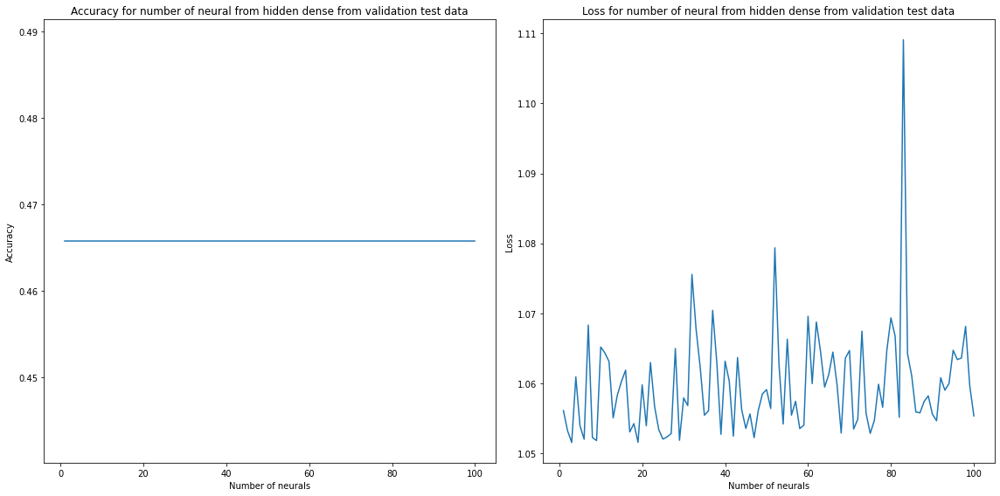

Best Number of neurons: 3
Best loss: 1.0515304803848267
Best accuracy: 0.46572935581207275


In [74]:
layer1_neuron = [i for i in range(1, 101)]
loss_list = []
accuracy_list = []

for j in layer1_neuron:
    model = Sequential()
    model.add(Dense(21, activation='relu', input_shape=(X_validate.shape[1],), kernel_regularizer=regularizers.l2(0.0617)))
    model.add(Dropout(0.35))
    model.add(Dense(j, activation='tanh', kernel_regularizer=regularizers.l2(0.01)))
    model.add(Dropout(0.02))
    model.add(Dense(16, activation='relu', kernel_regularizer=regularizers.l2(0.01)))
    model.add(Dropout(0.2))
    model.add(Dense(3, activation='softmax', kernel_regularizer=regularizers.l2(0.01)))

    optimizer = Adam(learning_rate=0.0969)

    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    model.fit(X_validate, y_validate_categorical, epochs=10)

    model_score = model.evaluate(X_test_validate, y_test_validate_categorical)
    loss_list.append(model_score[0])
    accuracy_list.append(model_score[1])

fig, axes = plt.subplots(1,2, figsize=(16,8))
axes[0].plot(layer1_neuron, accuracy_list)
axes[0].set_title('Accuracy for number of neural from hidden dense from validation test data')
axes[0].set_xlabel('Number of neurals')
axes[0].set_ylabel('Accuracy')

axes[1].plot(layer1_neuron, loss_list)
axes[1].set_title('Loss for number of neural from hidden dense from validation test data')
axes[1].set_xlabel('Number of neurals')
axes[1].set_ylabel('Loss')

plt.tight_layout()
plt.savefig('NN5.jpg')
plt.show()

full_layer1_neuron = list(zip(loss_list, accuracy_list))
full_layer1_neuron = np.array(full_layer1_neuron) 

best_accuracy_indices = np.where(full_layer1_neuron[:, 1] == max(accuracy_list))[0]
best_loss_index = np.argmin(full_layer1_neuron[best_accuracy_indices, 0])
best_index = best_accuracy_indices[best_loss_index]
best_loss = full_layer1_neuron[best_index, 0]
best_accuracy = full_layer1_neuron[best_index, 1]
best_number_neuron = layer1_neuron[best_index]
print(f'Best Number of neurons: {best_number_neuron}')
print(f'Best loss: {best_loss}')
print(f'Best accuracy: {best_accuracy}')


Epoch 1/10
72/72 [==============================] - 1s 2ms/step - loss: 1.1676 - accuracy: 0.4688
Epoch 2/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0869 - accuracy: 0.4789
Epoch 3/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0637 - accuracy: 0.4789
Epoch 4/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0577 - accuracy: 0.4789
Epoch 5/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0564 - accuracy: 0.4789
Epoch 6/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0575 - accuracy: 0.4789
Epoch 7/10
72/72 [==============================] - 0s 3ms/step - loss: 1.0522 - accuracy: 0.4789
Epoch 8/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0537 - accuracy: 0.4789
Epoch 9/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0552 - accuracy: 0.4789
Epoch 10/10
18/18 [==============================] - 0s 1ms/step - loss: 1.0566 - accuracy: 0.4657
Epoch 1/10
72/72 [=

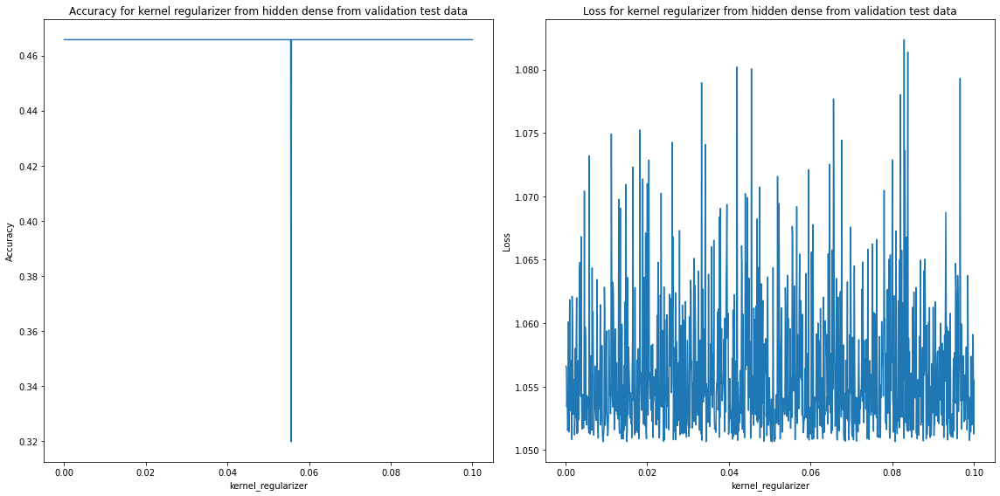

Best kernel_regularizer: 0.0506
Best loss: 1.0506523847579956
Best accuracy: 0.46572935581207275


In [76]:
kernel_regularizer_list = [i/10000 for i in range(1, 1001)]
loss_list = []
accuracy_list = []

for j in kernel_regularizer_list:
    model = Sequential()
    model.add(Dense(21, activation='relu', input_shape=(X_validate.shape[1],), kernel_regularizer=regularizers.l2(0.0617)))
    model.add(Dropout(0.35))
    model.add(Dense(3, activation='tanh', kernel_regularizer=regularizers.l2(j)))
    model.add(Dropout(0.02))
    model.add(Dense(16, activation='relu', kernel_regularizer=regularizers.l2(0.01)))
    model.add(Dropout(0.2))
    model.add(Dense(3, activation='softmax', kernel_regularizer=regularizers.l2(0.01)))

    optimizer = Adam(learning_rate=0.0727)

    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    model.fit(X_validate, y_validate_categorical, epochs=10)

    model_score = model.evaluate(X_test_validate, y_test_validate_categorical)
    loss_list.append(model_score[0])
    accuracy_list.append(model_score[1])

fig, axes = plt.subplots(1,2, figsize=(16,8))
axes[0].plot(kernel_regularizer_list, accuracy_list)
axes[0].set_title('Accuracy for kernel regularizer from hidden dense from validation test data')
axes[0].set_xlabel('kernel_regularizer')
axes[0].set_ylabel('Accuracy')

axes[1].plot(kernel_regularizer_list, loss_list)
axes[1].set_title('Loss for kernel regularizer from hidden dense from validation test data')
axes[1].set_xlabel('kernel_regularizer')
axes[1].set_ylabel('Loss')

plt.tight_layout()
plt.savefig('NN6.jpg')
plt.show() 

full_kernel_regularizer_list = list(zip(loss_list, accuracy_list))
full_kernel_regularizer_list = np.array(full_kernel_regularizer_list) 

best_accuracy_indices = np.where(full_kernel_regularizer_list[:, 1] == max(accuracy_list))[0]
best_loss_index = np.argmin(full_kernel_regularizer_list[best_accuracy_indices, 0])
best_index = best_accuracy_indices[best_loss_index]
best_loss = full_kernel_regularizer_list[best_index, 0]
best_accuracy = full_kernel_regularizer_list[best_index, 1]
best_kernel_regularizer = kernel_regularizer_list[best_index]
print(f'Best kernel_regularizer: {best_kernel_regularizer}')
print(f'Best loss: {best_loss}')
print(f'Best accuracy: {best_accuracy}')


Epoch 1/10
72/72 [==============================] - 1s 2ms/step - loss: 1.1999 - accuracy: 0.4714
Epoch 2/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0590 - accuracy: 0.4789
Epoch 3/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0522 - accuracy: 0.4789
Epoch 4/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0553 - accuracy: 0.4789
Epoch 5/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0543 - accuracy: 0.4789
Epoch 6/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0537 - accuracy: 0.4789
Epoch 7/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0520 - accuracy: 0.4789
Epoch 8/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0549 - accuracy: 0.4789
Epoch 9/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0574 - accuracy: 0.4789
Epoch 10/10
18/18 [==============================] - 0s 1ms/step - loss: 1.0697 - accuracy: 0.4657
Epoch 1/10
72/72 [=

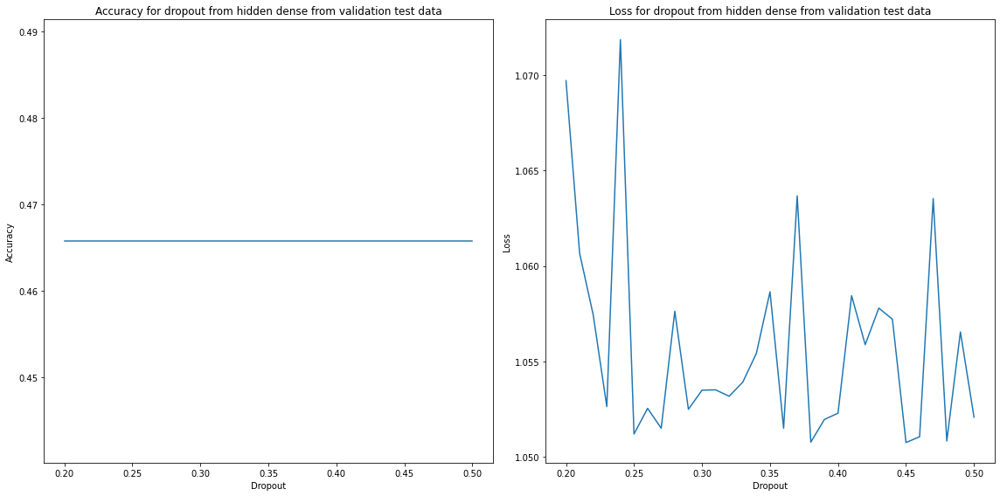

Best Dropout: 0.45
Best loss: 1.0507558584213257
Best accuracy: 0.46572935581207275


In [82]:
Dropout_list = [i/100 for i in range(20, 51)]
loss_list = []
accuracy_list = []

for j in Dropout_list:
    model = Sequential()
    model.add(Dense(21, activation='relu', input_shape=(X_validate.shape[1],), kernel_regularizer=regularizers.l2(0.0617)))
    model.add(Dropout(0.35))
    model.add(Dense(3, activation='tanh', kernel_regularizer=regularizers.l2(0.0506)))
    model.add(Dropout(j))
    model.add(Dense(16, activation='relu', kernel_regularizer=regularizers.l2(0.01)))
    model.add(Dropout(0.2))
    model.add(Dense(3, activation='softmax', kernel_regularizer=regularizers.l2(0.01)))

    optimizer = Adam(learning_rate=0.0727)

    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    model.fit(X_validate, y_validate_categorical, epochs=10)

    model_score = model.evaluate(X_test_validate, y_test_validate_categorical)
    loss_list.append(model_score[0])
    accuracy_list.append(model_score[1])

fig, axes = plt.subplots(1,2, figsize=(16,8))
axes[0].plot(Dropout_list, accuracy_list)
axes[0].set_title('Accuracy for dropout from hidden dense from validation test data')
axes[0].set_xlabel('Dropout')
axes[0].set_ylabel('Accuracy')

axes[1].plot(Dropout_list, loss_list)
axes[1].set_title('Loss for dropout from hidden dense from validation test data')
axes[1].set_xlabel('Dropout')
axes[1].set_ylabel('Loss')

plt.tight_layout()
plt.savefig('NN7.jpg')
plt.show() 

full_Dropout_list = list(zip(loss_list, accuracy_list))
full_Dropout_list = np.array(full_Dropout_list) 

best_accuracy_indices = np.where(full_Dropout_list[:, 1] == max(accuracy_list))[0]
best_loss_index = np.argmin(full_Dropout_list[best_accuracy_indices, 0])
best_index = best_accuracy_indices[best_loss_index]
best_loss = full_Dropout_list[best_index, 0]
best_accuracy = full_Dropout_list[best_index, 1]
best_Dropout = Dropout_list[best_index]
print(f'Best Dropout: {best_Dropout}')
print(f'Best loss: {best_loss}')
print(f'Best accuracy: {best_accuracy}')


Epoch 1/10
72/72 [==============================] - 1s 2ms/step - loss: 1.0805 - accuracy: 0.4741
Epoch 2/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0533 - accuracy: 0.4789
Epoch 3/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0549 - accuracy: 0.4789
Epoch 4/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0571 - accuracy: 0.4789
Epoch 5/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0525 - accuracy: 0.4789
Epoch 6/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0539 - accuracy: 0.4789
Epoch 7/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0534 - accuracy: 0.4670
Epoch 8/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0569 - accuracy: 0.4789
Epoch 9/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0558 - accuracy: 0.4789
Epoch 10/10
18/18 [==============================] - 0s 1ms/step - loss: 1.0627 - accuracy: 0.4657
Epoch 1/10
72/72 [=

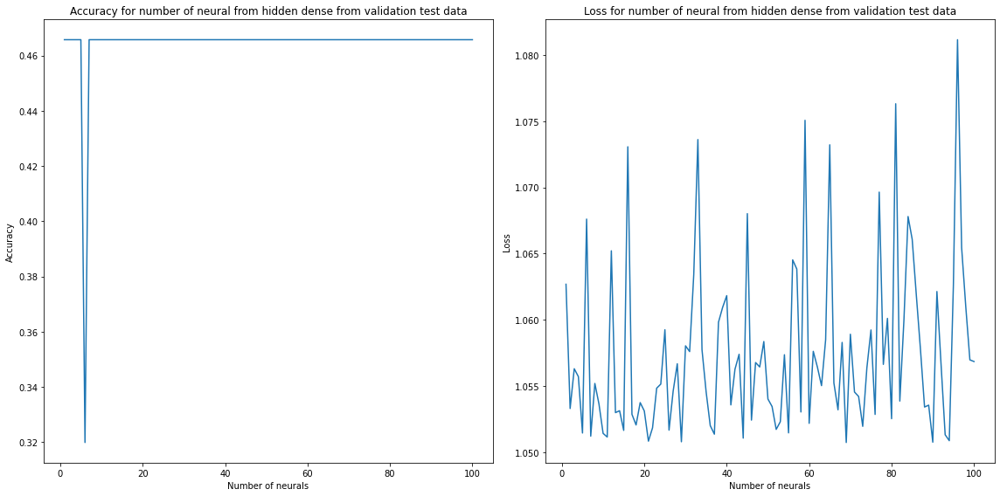

Best Number of neurons: 69
Best loss: 1.0507313013076782
Best accuracy: 0.46572935581207275


In [83]:
layer1_neuron = [i for i in range(1, 101)]
loss_list = []
accuracy_list = []

for j in layer1_neuron:
    model = Sequential()
    model.add(Dense(21, activation='relu', input_shape=(X_validate.shape[1],), kernel_regularizer=regularizers.l2(0.0617)))
    model.add(Dropout(0.35))
    model.add(Dense(3, activation='tanh', kernel_regularizer=regularizers.l2(0.0506)))
    model.add(Dropout(0.45))
    model.add(Dense(j, activation='relu', kernel_regularizer=regularizers.l2(0.01)))
    model.add(Dropout(0.2))
    model.add(Dense(3, activation='softmax', kernel_regularizer=regularizers.l2(0.01)))

    optimizer = Adam(learning_rate=0.0969)

    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    model.fit(X_validate, y_validate_categorical, epochs=10)

    model_score = model.evaluate(X_test_validate, y_test_validate_categorical)
    loss_list.append(model_score[0])
    accuracy_list.append(model_score[1])

fig, axes = plt.subplots(1,2, figsize=(16,8))
axes[0].plot(layer1_neuron, accuracy_list)
axes[0].set_title('Accuracy for number of neural from hidden dense from validation test data')
axes[0].set_xlabel('Number of neurals')
axes[0].set_ylabel('Accuracy')

axes[1].plot(layer1_neuron, loss_list)
axes[1].set_title('Loss for number of neural from hidden dense from validation test data')
axes[1].set_xlabel('Number of neurals')
axes[1].set_ylabel('Loss')

plt.tight_layout()
plt.savefig('NN8.jpg')
plt.show()

full_layer1_neuron = list(zip(loss_list, accuracy_list))
full_layer1_neuron = np.array(full_layer1_neuron) 

best_accuracy_indices = np.where(full_layer1_neuron[:, 1] == max(accuracy_list))[0]
best_loss_index = np.argmin(full_layer1_neuron[best_accuracy_indices, 0])
best_index = best_accuracy_indices[best_loss_index]
best_loss = full_layer1_neuron[best_index, 0]
best_accuracy = full_layer1_neuron[best_index, 1]
best_number_neuron = layer1_neuron[best_index]
print(f'Best Number of neurons: {best_number_neuron}')
print(f'Best loss: {best_loss}')
print(f'Best accuracy: {best_accuracy}')


Epoch 1/10
72/72 [==============================] - 1s 2ms/step - loss: 1.2728 - accuracy: 0.4551
Epoch 2/10
72/72 [==============================] - 0s 2ms/step - loss: 1.1187 - accuracy: 0.4771
Epoch 3/10
72/72 [==============================] - 0s 2ms/step - loss: 1.1725 - accuracy: 0.4780
Epoch 4/10
72/72 [==============================] - 0s 2ms/step - loss: 1.1766 - accuracy: 0.4789
Epoch 5/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0918 - accuracy: 0.4749
Epoch 6/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0888 - accuracy: 0.4776
Epoch 7/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0555 - accuracy: 0.4789
Epoch 8/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0536 - accuracy: 0.4789
Epoch 9/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0554 - accuracy: 0.4789
Epoch 10/10
18/18 [==============================] - 0s 1ms/step - loss: 1.0590 - accuracy: 0.4657
Epoch 1/10
72/72 [=

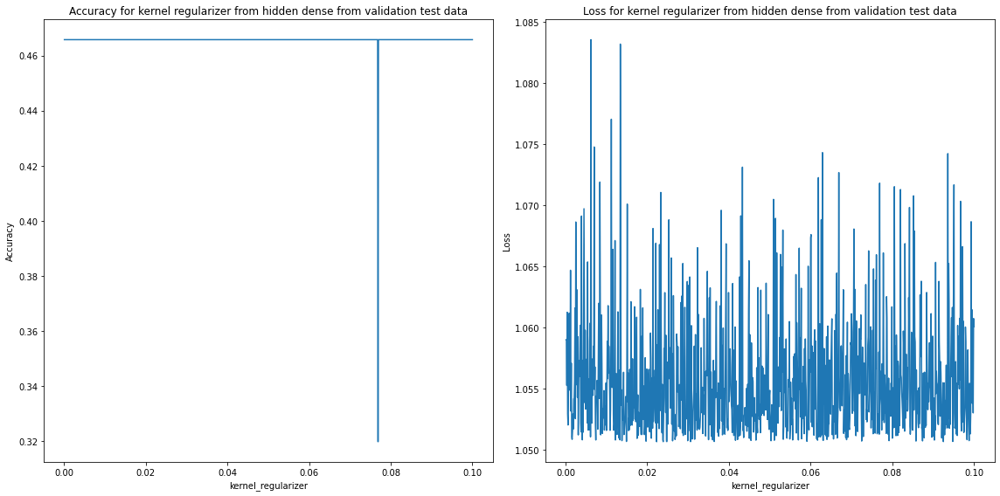

Best kernel_regularizer: 0.0223
Best loss: 1.0506620407104492
Best accuracy: 0.46572935581207275


In [84]:
kernel_regularizer_list = [i/10000 for i in range(1, 1001)]
loss_list = []
accuracy_list = []

for j in kernel_regularizer_list:
    model = Sequential()
    model.add(Dense(21, activation='relu', input_shape=(X_validate.shape[1],), kernel_regularizer=regularizers.l2(0.0617)))
    model.add(Dropout(0.35))
    model.add(Dense(3, activation='tanh', kernel_regularizer=regularizers.l2(0.0506)))
    model.add(Dropout(0.38))
    model.add(Dense(69, activation='relu', kernel_regularizer=regularizers.l2(j)))
    model.add(Dropout(0.2))
    model.add(Dense(3, activation='softmax', kernel_regularizer=regularizers.l2(0.01)))

    optimizer = Adam(learning_rate=0.0727)

    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    model.fit(X_validate, y_validate_categorical, epochs=10)

    model_score = model.evaluate(X_test_validate, y_test_validate_categorical)
    loss_list.append(model_score[0])
    accuracy_list.append(model_score[1])

fig, axes = plt.subplots(1,2, figsize=(16,8))
axes[0].plot(kernel_regularizer_list, accuracy_list)
axes[0].set_title('Accuracy for kernel regularizer from hidden dense from validation test data')
axes[0].set_xlabel('kernel_regularizer')
axes[0].set_ylabel('Accuracy')

axes[1].plot(kernel_regularizer_list, loss_list)
axes[1].set_title('Loss for kernel regularizer from hidden dense from validation test data')
axes[1].set_xlabel('kernel_regularizer')
axes[1].set_ylabel('Loss')

plt.tight_layout()
plt.savefig('NN9.jpg')
plt.show() 

full_kernel_regularizer_list = list(zip(loss_list, accuracy_list))
full_kernel_regularizer_list = np.array(full_kernel_regularizer_list) 

best_accuracy_indices = np.where(full_kernel_regularizer_list[:, 1] == max(accuracy_list))[0]
best_loss_index = np.argmin(full_kernel_regularizer_list[best_accuracy_indices, 0])
best_index = best_accuracy_indices[best_loss_index]
best_loss = full_kernel_regularizer_list[best_index, 0]
best_accuracy = full_kernel_regularizer_list[best_index, 1]
best_kernel_regularizer = kernel_regularizer_list[best_index]
print(f'Best kernel_regularizer: {best_kernel_regularizer}')
print(f'Best loss: {best_loss}')
print(f'Best accuracy: {best_accuracy}')


Epoch 1/10
72/72 [==============================] - 1s 2ms/step - loss: 1.2072 - accuracy: 0.4727
Epoch 2/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0651 - accuracy: 0.4789
Epoch 3/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0541 - accuracy: 0.4789
Epoch 4/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0576 - accuracy: 0.4789
Epoch 5/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0546 - accuracy: 0.4789
Epoch 6/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0517 - accuracy: 0.4789
Epoch 7/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0559 - accuracy: 0.4789
Epoch 8/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0540 - accuracy: 0.4789
Epoch 9/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0545 - accuracy: 0.4789
Epoch 10/10
18/18 [==============================] - 0s 1ms/step - loss: 1.0545 - accuracy: 0.4657
Epoch 1/10
72/72 [=

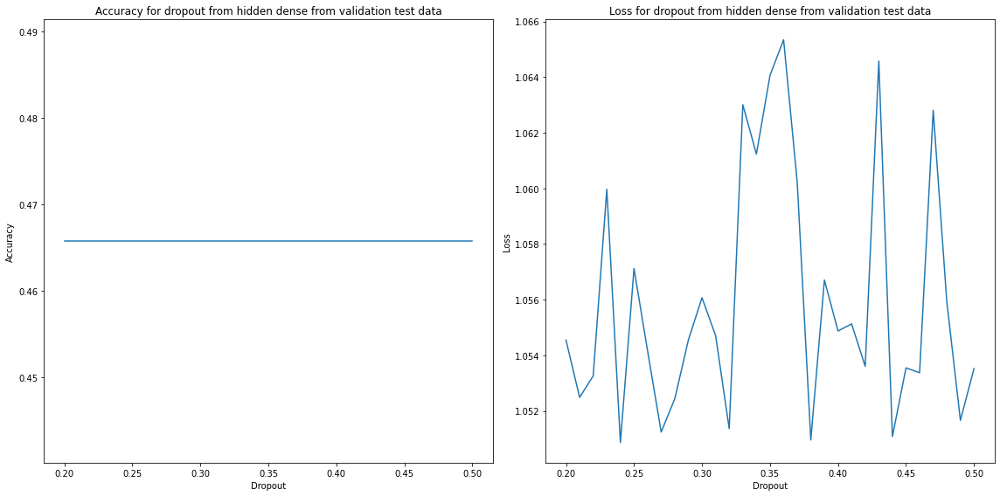

Best Dropout: 0.24
Best loss: 1.050868034362793
Best accuracy: 0.46572935581207275


In [86]:
Dropout_list = [i/100 for i in range(20, 51)]
loss_list = []
accuracy_list = []

for j in Dropout_list:
    model = Sequential()
    model.add(Dense(21, activation='relu', input_shape=(X_validate.shape[1],), kernel_regularizer=regularizers.l2(0.0617)))
    model.add(Dropout(0.35))
    model.add(Dense(3, activation='tanh', kernel_regularizer=regularizers.l2(0.0506)))
    model.add(Dropout(0.38))
    model.add(Dense(69, activation='relu', kernel_regularizer=regularizers.l2(0.0223)))
    model.add(Dropout(j))
    model.add(Dense(3, activation='softmax', kernel_regularizer=regularizers.l2(0.01)))

    optimizer = Adam(learning_rate=0.0727)

    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    model.fit(X_validate, y_validate_categorical, epochs=10)

    model_score = model.evaluate(X_test_validate, y_test_validate_categorical)
    loss_list.append(model_score[0])
    accuracy_list.append(model_score[1])

fig, axes = plt.subplots(1,2, figsize=(16,8))
axes[0].plot(Dropout_list, accuracy_list)
axes[0].set_title('Accuracy for dropout from hidden dense from validation test data')
axes[0].set_xlabel('Dropout')
axes[0].set_ylabel('Accuracy')

axes[1].plot(Dropout_list, loss_list)
axes[1].set_title('Loss for dropout from hidden dense from validation test data')
axes[1].set_xlabel('Dropout')
axes[1].set_ylabel('Loss')

plt.tight_layout()
plt.savefig('NN10.jpg')
plt.show() 

full_Dropout_list = list(zip(loss_list, accuracy_list))
full_Dropout_list = np.array(full_Dropout_list) 

best_accuracy_indices = np.where(full_Dropout_list[:, 1] == max(accuracy_list))[0]
best_loss_index = np.argmin(full_Dropout_list[best_accuracy_indices, 0])
best_index = best_accuracy_indices[best_loss_index]
best_loss = full_Dropout_list[best_index, 0]
best_accuracy = full_Dropout_list[best_index, 1]
best_Dropout = Dropout_list[best_index]
print(f'Best Dropout: {best_Dropout}')
print(f'Best loss: {best_loss}')
print(f'Best accuracy: {best_accuracy}')


Epoch 1/10
72/72 [==============================] - 1s 2ms/step - loss: 1.2049 - accuracy: 0.4639
Epoch 2/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0703 - accuracy: 0.4789
Epoch 3/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0609 - accuracy: 0.4789
Epoch 4/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0545 - accuracy: 0.4789
Epoch 5/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0556 - accuracy: 0.4789
Epoch 6/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0544 - accuracy: 0.4789
Epoch 7/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0554 - accuracy: 0.4789
Epoch 8/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0533 - accuracy: 0.4789
Epoch 9/10
72/72 [==============================] - 0s 2ms/step - loss: 1.0547 - accuracy: 0.4789
Epoch 10/10
18/18 [==============================] - 0s 1ms/step - loss: 1.0525 - accuracy: 0.4657
Epoch 1/10
72/72 [=

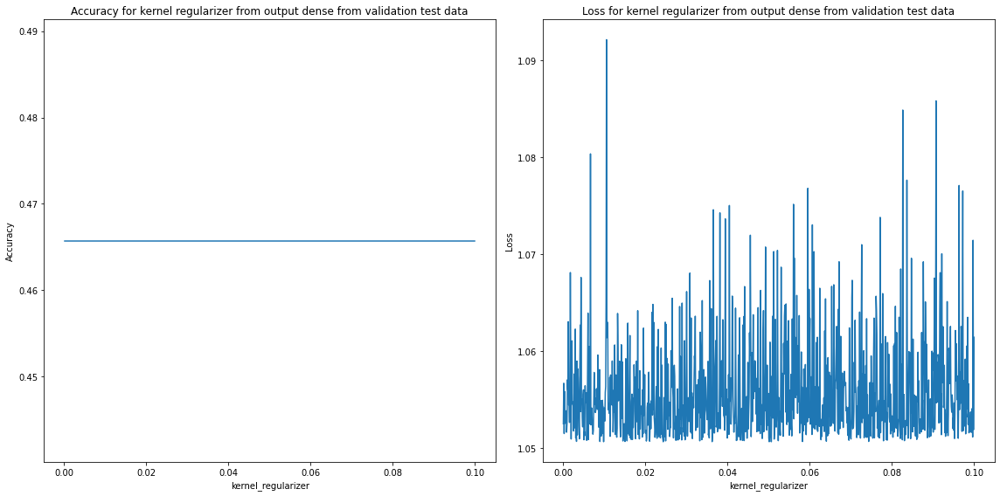

Best kernel_regularizer: 0.0244
Best loss: 1.0506528615951538
Best accuracy: 0.46572935581207275


In [87]:
kernel_regularizer_list = [i/10000 for i in range(1, 1001)]
loss_list = []
accuracy_list = []

for j in kernel_regularizer_list:
    model = Sequential()
    model.add(Dense(21, activation='relu', input_shape=(X_validate.shape[1],), kernel_regularizer=regularizers.l2(0.0617)))
    model.add(Dropout(0.35))
    model.add(Dense(3, activation='tanh', kernel_regularizer=regularizers.l2(0.0506)))
    model.add(Dropout(0.38))
    model.add(Dense(69, activation='relu', kernel_regularizer=regularizers.l2(0.0223)))
    model.add(Dropout(0.24))
    model.add(Dense(3, activation='softmax', kernel_regularizer=regularizers.l2(j)))

    optimizer = Adam(learning_rate=0.0727)

    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    model.fit(X_validate, y_validate_categorical, epochs=10)

    model_score = model.evaluate(X_test_validate, y_test_validate_categorical)
    loss_list.append(model_score[0])
    accuracy_list.append(model_score[1])

fig, axes = plt.subplots(1,2, figsize=(16,8))
axes[0].plot(kernel_regularizer_list, accuracy_list)
axes[0].set_title('Accuracy for kernel regularizer from output dense from validation test data')
axes[0].set_xlabel('kernel_regularizer')
axes[0].set_ylabel('Accuracy')

axes[1].plot(kernel_regularizer_list, loss_list)
axes[1].set_title('Loss for kernel regularizer from output dense from validation test data')
axes[1].set_xlabel('kernel_regularizer')
axes[1].set_ylabel('Loss')

plt.tight_layout()
plt.savefig('NN11.jpg')
plt.show() 

full_kernel_regularizer_list = list(zip(loss_list, accuracy_list))
full_kernel_regularizer_list = np.array(full_kernel_regularizer_list) 

best_accuracy_indices = np.where(full_kernel_regularizer_list[:, 1] == max(accuracy_list))[0]
best_loss_index = np.argmin(full_kernel_regularizer_list[best_accuracy_indices, 0])
best_index = best_accuracy_indices[best_loss_index]
best_loss = full_kernel_regularizer_list[best_index, 0]
best_accuracy = full_kernel_regularizer_list[best_index, 1]
best_kernel_regularizer = kernel_regularizer_list[best_index]
print(f'Best kernel_regularizer: {best_kernel_regularizer}')
print(f'Best loss: {best_loss}')
print(f'Best accuracy: {best_accuracy}')


In [88]:
X_train = np.array(X_train)
X_test = np.array(X_test)
y_train_categorical = to_categorical(y_train)
y_test_categorical = to_categorical(y_test)

Epoch 1/10
89/89 [==============================] - 1s 2ms/step - loss: 1.1636 - accuracy: 0.4643
Epoch 2/10
89/89 [==============================] - 0s 2ms/step - loss: 1.0598 - accuracy: 0.4763
Epoch 3/10
89/89 [==============================] - 0s 2ms/step - loss: 1.0548 - accuracy: 0.4763
Epoch 4/10
89/89 [==============================] - 0s 2ms/step - loss: 1.0534 - accuracy: 0.4763
Epoch 5/10
89/89 [==============================] - 0s 2ms/step - loss: 1.0536 - accuracy: 0.4763
Epoch 6/10
89/89 [==============================] - 0s 2ms/step - loss: 1.0540 - accuracy: 0.4763
Epoch 7/10
89/89 [==============================] - 0s 2ms/step - loss: 1.0522 - accuracy: 0.4763
Epoch 8/10
89/89 [==============================] - 0s 2ms/step - loss: 1.0544 - accuracy: 0.4763
Epoch 9/10
89/89 [==============================] - 0s 2ms/step - loss: 1.0561 - accuracy: 0.4629
Epoch 10/10
11/11 [==============================] - 0s 2ms/step - loss: 1.0410 - accuracy: 0.4912
Epoch 1/10
89/89 [=

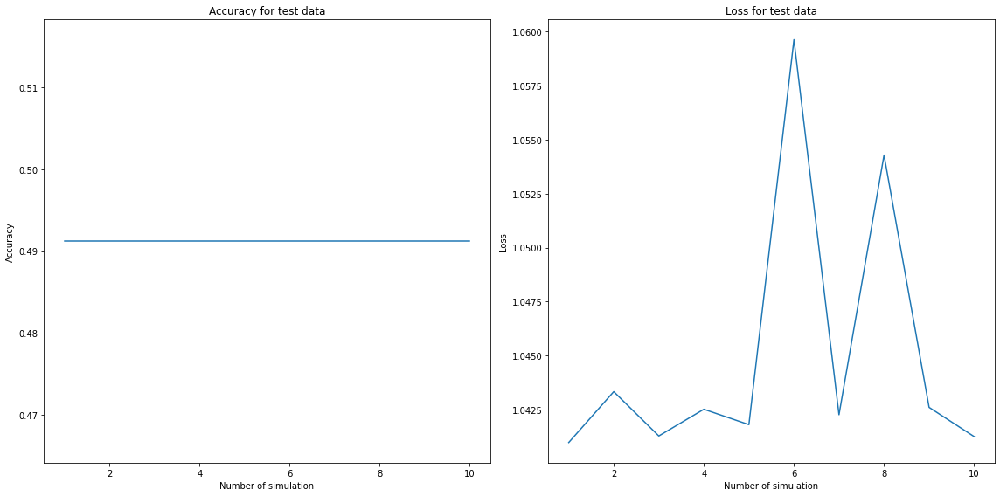

In [93]:
loss_list = []
accuracy_list = []

for i in range(10):
    model = Sequential()
    model.add(Dense(21, activation='relu', input_shape=(X_train.shape[1],), kernel_regularizer=regularizers.l2(0.0617)))
    model.add(Dropout(0.35))
    model.add(Dense(3, activation='tanh', kernel_regularizer=regularizers.l2(0.0506)))
    model.add(Dropout(0.38))
    model.add(Dense(69, activation='relu', kernel_regularizer=regularizers.l2(0.0223)))
    model.add(Dropout(0.24))
    model.add(Dense(3, activation='softmax', kernel_regularizer=regularizers.l2(0.0244)))

    optimizer = Adam(learning_rate=0.0727)

    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    model.fit(X_train, y_train_categorical, epochs=10)

    model_score = model.evaluate(X_test, y_test_categorical)
    loss_list.append(model_score[0])
    accuracy_list.append(model_score[1])

fig, axes = plt.subplots(1,2, figsize=(16,8))
axes[0].plot(range(1,11), accuracy_list)
axes[0].set_title('Accuracy for test data')
axes[0].set_xlabel('Number of simulation')
axes[0].set_ylabel('Accuracy')

axes[1].plot(range(1,11), loss_list)
axes[1].set_title('Loss for test data')
axes[1].set_xlabel('Number of simulation')
axes[1].set_ylabel('Loss')

plt.tight_layout()
plt.savefig('NN_final.jpg')
plt.show() 



# RNN

Epoch 1/10
89/89 [==============================] - 3s 4ms/step - loss: 1.3740 - accuracy: 0.4587
Epoch 2/10
89/89 [==============================] - 0s 4ms/step - loss: 1.0547 - accuracy: 0.4763
Epoch 3/10
89/89 [==============================] - 0s 4ms/step - loss: 1.0556 - accuracy: 0.4763
Epoch 4/10
89/89 [==============================] - 0s 4ms/step - loss: 1.0546 - accuracy: 0.4763
Epoch 5/10
89/89 [==============================] - 0s 4ms/step - loss: 1.0524 - accuracy: 0.4763
Epoch 6/10
89/89 [==============================] - 0s 4ms/step - loss: 1.0522 - accuracy: 0.4763
Epoch 7/10
89/89 [==============================] - 0s 4ms/step - loss: 1.0530 - accuracy: 0.4763
Epoch 8/10
89/89 [==============================] - 0s 4ms/step - loss: 1.0541 - accuracy: 0.4763
Epoch 9/10
89/89 [==============================] - 0s 4ms/step - loss: 1.0529 - accuracy: 0.4763
Epoch 10/10
11/11 [==============================] - 0s 3ms/step - loss: 1.0428 - accuracy: 0.4912
Epoch 1/10
89/89 [=

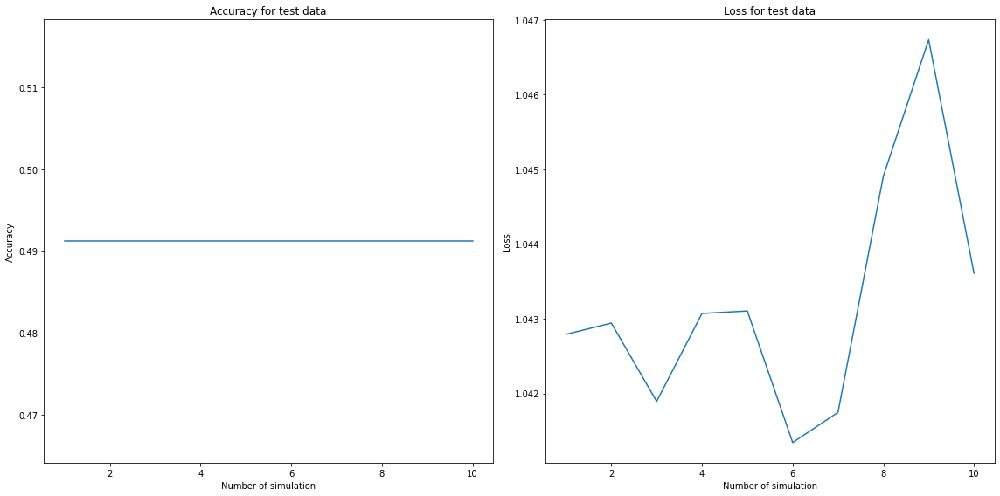

In [117]:
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import SimpleRNN, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import regularizers

loss_list = []
accuracy_list = []

for i in range(10):
    model = Sequential()
    model.add(SimpleRNN(64, activation='relu', input_shape=(X_train.shape[1], 1), kernel_regularizer=regularizers.l2(0.0617)))
    model.add(Dropout(0.35))
    model.add(Dense(21, activation='relu', kernel_regularizer=regularizers.l2(0.0617)))
    model.add(Dropout(0.35))
    model.add(Dense(3, activation='tanh', kernel_regularizer=regularizers.l2(0.0506)))
    model.add(Dropout(0.38))
    model.add(Dense(69, activation='relu', kernel_regularizer=regularizers.l2(0.0223)))
    model.add(Dropout(0.24))
    model.add(Dense(3, activation='softmax', kernel_regularizer=regularizers.l2(0.0244)))

    optimizer = Adam(learning_rate=0.0727)

    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    model.fit(X_train.reshape(X_train.shape[0], X_train.shape[1], 1), y_train_categorical, epochs=10)

    model_score = model.evaluate(X_test.reshape(X_test.shape[0], X_test.shape[1], 1), y_test_categorical)
    loss_list.append(model_score[0])
    accuracy_list.append(model_score[1])

fig, axes = plt.subplots(1,2, figsize=(16,8))
axes[0].plot(range(1,11), accuracy_list)
axes[0].set_title('Accuracy for test data')
axes[0].set_xlabel('Number of simulation')
axes[0].set_ylabel('Accuracy')

axes[1].plot(range(1,11), loss_list)
axes[1].set_title('Loss for test data')
axes[1].set_xlabel('Number of simulation')
axes[1].set_ylabel('Loss')

plt.tight_layout()
plt.show() 


Epoch 1/10
72/72 [==============================] - 4s 3ms/step - loss: 1.1008 - accuracy: 0.4723
Epoch 2/10
72/72 [==============================] - 0s 3ms/step - loss: 1.0568 - accuracy: 0.4789
Epoch 3/10
72/72 [==============================] - 0s 3ms/step - loss: 1.0522 - accuracy: 0.4789
Epoch 4/10
72/72 [==============================] - 0s 3ms/step - loss: 1.0591 - accuracy: 0.4670
Epoch 5/10
72/72 [==============================] - 0s 3ms/step - loss: 1.0549 - accuracy: 0.4741
Epoch 6/10
72/72 [==============================] - 0s 3ms/step - loss: 1.0549 - accuracy: 0.4789
Epoch 7/10
72/72 [==============================] - 0s 3ms/step - loss: 1.0556 - accuracy: 0.4789
Epoch 8/10
72/72 [==============================] - 0s 3ms/step - loss: 1.0539 - accuracy: 0.4789
Epoch 9/10
72/72 [==============================] - 0s 3ms/step - loss: 1.0554 - accuracy: 0.4789
Epoch 10/10
18/18 [==============================] - 0s 1ms/step - loss: 1.0729 - accuracy: 0.4657
Epoch 1/10
72/72 [=

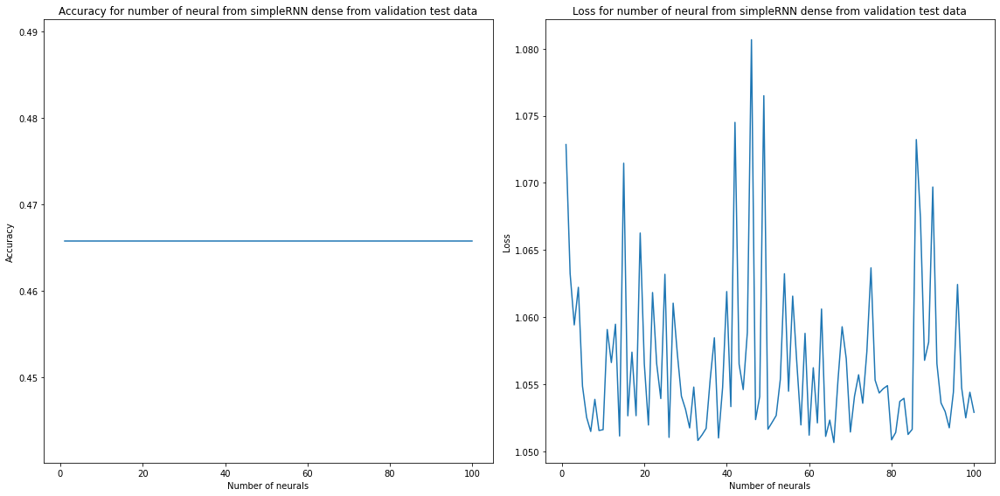

Best Number of neurons: 66
Best loss: 1.0506526231765747
Best accuracy: 0.46572935581207275


In [120]:
layer1_neuron = [i for i in range(1, 101)]
loss_list = []
accuracy_list = []

for j in layer1_neuron:
    model = Sequential()
    model.add(SimpleRNN(j, activation='relu', input_shape=(X_validate.shape[1], 1), kernel_regularizer=regularizers.l2(0.0617)))
    model.add(Dropout(0.35))
    model.add(Dense(21, activation='relu', input_shape=(X_validate.shape[1],), kernel_regularizer=regularizers.l2(0.0617)))
    model.add(Dropout(0.35))
    model.add(Dense(3, activation='tanh', kernel_regularizer=regularizers.l2(0.0506)))
    model.add(Dropout(0.38))
    model.add(Dense(69, activation='relu', kernel_regularizer=regularizers.l2(0.0223)))
    model.add(Dropout(0.24))
    model.add(Dense(3, activation='softmax', kernel_regularizer=regularizers.l2(0.0244)))

    optimizer = Adam(learning_rate=0.0969)

    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    model.fit(X_validate, y_validate_categorical, epochs=10)

    model_score = model.evaluate(X_test_validate, y_test_validate_categorical)
    loss_list.append(model_score[0])
    accuracy_list.append(model_score[1])

fig, axes = plt.subplots(1,2, figsize=(16,8))
axes[0].plot(layer1_neuron, accuracy_list)
axes[0].set_title('Accuracy for number of neural from simpleRNN dense from validation test data')
axes[0].set_xlabel('Number of neurals')
axes[0].set_ylabel('Accuracy')

axes[1].plot(layer1_neuron, loss_list)
axes[1].set_title('Loss for number of neural from simpleRNN dense from validation test data')
axes[1].set_xlabel('Number of neurals')
axes[1].set_ylabel('Loss')

plt.tight_layout()
plt.savefig('RNN1.jpg')
plt.show()

full_layer1_neuron = list(zip(loss_list, accuracy_list))
full_layer1_neuron = np.array(full_layer1_neuron) 

best_accuracy_indices = np.where(full_layer1_neuron[:, 1] == max(accuracy_list))[0]
best_loss_index = np.argmin(full_layer1_neuron[best_accuracy_indices, 0])
best_index = best_accuracy_indices[best_loss_index]
best_loss = full_layer1_neuron[best_index, 0]
best_accuracy = full_layer1_neuron[best_index, 1]
best_number_neuron = layer1_neuron[best_index]
print(f'Best Number of neurons: {best_number_neuron}')
print(f'Best loss: {best_loss}')
print(f'Best accuracy: {best_accuracy}')


Epoch 1/10
72/72 [==============================] - 2s 4ms/step - loss: 1.4115 - accuracy: 0.4644
Epoch 2/10
72/72 [==============================] - 0s 4ms/step - loss: 1.0860 - accuracy: 0.4785
Epoch 3/10
72/72 [==============================] - 0s 4ms/step - loss: 1.0560 - accuracy: 0.4789
Epoch 4/10
72/72 [==============================] - 0s 4ms/step - loss: 1.0521 - accuracy: 0.4789
Epoch 5/10
72/72 [==============================] - 0s 4ms/step - loss: 1.0559 - accuracy: 0.4789
Epoch 6/10
72/72 [==============================] - 0s 4ms/step - loss: 1.0536 - accuracy: 0.4789
Epoch 7/10
72/72 [==============================] - 0s 4ms/step - loss: 1.0534 - accuracy: 0.4789
Epoch 8/10
72/72 [==============================] - 0s 4ms/step - loss: 1.0514 - accuracy: 0.4789
Epoch 9/10
72/72 [==============================] - 0s 4ms/step - loss: 1.0584 - accuracy: 0.4789
Epoch 10/10
18/18 [==============================] - 0s 2ms/step - loss: 1.0514 - accuracy: 0.4657
Epoch 1/10
72/72 [=

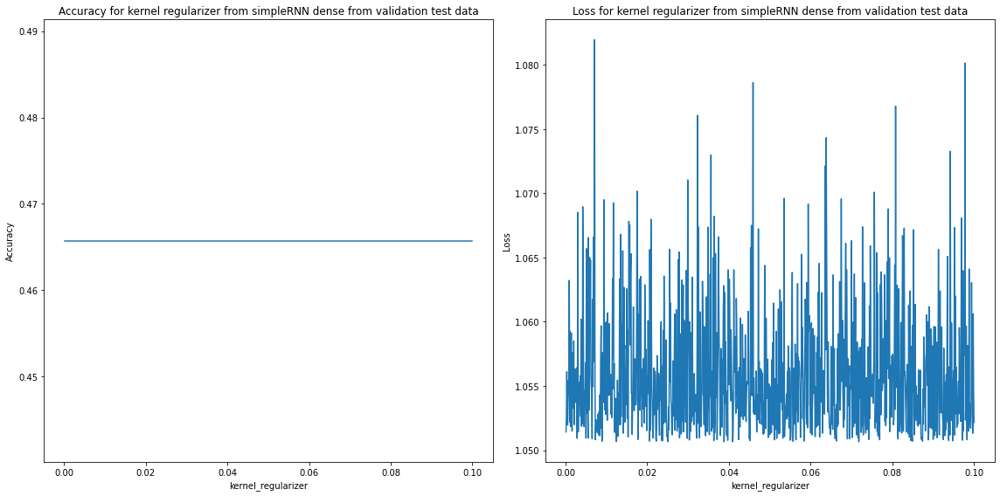

Best kernel_regularizer: 0.0409
Best loss: 1.050661325454712
Best accuracy: 0.46572935581207275


In [121]:
kernel_regularizer_list = [i/10000 for i in range(1, 1001)]
loss_list = []
accuracy_list = []

for j in kernel_regularizer_list:
    model = Sequential()
    model.add(SimpleRNN(66, activation='relu', input_shape=(X_validate.shape[1], 1), kernel_regularizer=regularizers.l2(j)))
    model.add(Dropout(0.35))
    model.add(Dense(21, activation='relu', input_shape=(X_validate.shape[1],), kernel_regularizer=regularizers.l2(0.0617)))
    model.add(Dropout(0.35))
    model.add(Dense(3, activation='tanh', kernel_regularizer=regularizers.l2(0.0506)))
    model.add(Dropout(0.38))
    model.add(Dense(69, activation='relu', kernel_regularizer=regularizers.l2(0.0223)))
    model.add(Dropout(0.24))
    model.add(Dense(3, activation='softmax', kernel_regularizer=regularizers.l2(0.0244)))

    optimizer = Adam(learning_rate=0.0727)

    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    model.fit(X_validate, y_validate_categorical, epochs=10)

    model_score = model.evaluate(X_test_validate, y_test_validate_categorical)
    loss_list.append(model_score[0])
    accuracy_list.append(model_score[1])

fig, axes = plt.subplots(1,2, figsize=(16,8))
axes[0].plot(kernel_regularizer_list, accuracy_list)
axes[0].set_title('Accuracy for kernel regularizer from simpleRNN dense from validation test data')
axes[0].set_xlabel('kernel_regularizer')
axes[0].set_ylabel('Accuracy')

axes[1].plot(kernel_regularizer_list, loss_list)
axes[1].set_title('Loss for kernel regularizer from simpleRNN dense from validation test data')
axes[1].set_xlabel('kernel_regularizer')
axes[1].set_ylabel('Loss')

plt.tight_layout()
plt.savefig('RNN2.jpg')
plt.show() 

full_kernel_regularizer_list = list(zip(loss_list, accuracy_list))
full_kernel_regularizer_list = np.array(full_kernel_regularizer_list) 

best_accuracy_indices = np.where(full_kernel_regularizer_list[:, 1] == max(accuracy_list))[0]
best_loss_index = np.argmin(full_kernel_regularizer_list[best_accuracy_indices, 0])
best_index = best_accuracy_indices[best_loss_index]
best_loss = full_kernel_regularizer_list[best_index, 0]
best_accuracy = full_kernel_regularizer_list[best_index, 1]
best_kernel_regularizer = kernel_regularizer_list[best_index]
print(f'Best kernel_regularizer: {best_kernel_regularizer}')
print(f'Best loss: {best_loss}')
print(f'Best accuracy: {best_accuracy}')


Epoch 1/10
72/72 [==============================] - 2s 4ms/step - loss: 1.5036 - accuracy: 0.4600
Epoch 2/10
72/72 [==============================] - 0s 4ms/step - loss: 1.0855 - accuracy: 0.4789
Epoch 3/10
72/72 [==============================] - 0s 4ms/step - loss: 1.0558 - accuracy: 0.4789
Epoch 4/10
72/72 [==============================] - 0s 4ms/step - loss: 1.0531 - accuracy: 0.4789
Epoch 5/10
72/72 [==============================] - 0s 4ms/step - loss: 1.0542 - accuracy: 0.4789
Epoch 6/10
72/72 [==============================] - 0s 4ms/step - loss: 1.0574 - accuracy: 0.4789
Epoch 7/10
72/72 [==============================] - 0s 4ms/step - loss: 1.0543 - accuracy: 0.4789
Epoch 8/10
72/72 [==============================] - 0s 4ms/step - loss: 1.0528 - accuracy: 0.4789
Epoch 9/10
72/72 [==============================] - 0s 4ms/step - loss: 1.0538 - accuracy: 0.4789
Epoch 10/10
18/18 [==============================] - 0s 2ms/step - loss: 1.0589 - accuracy: 0.4657
Epoch 1/10
72/72 [=

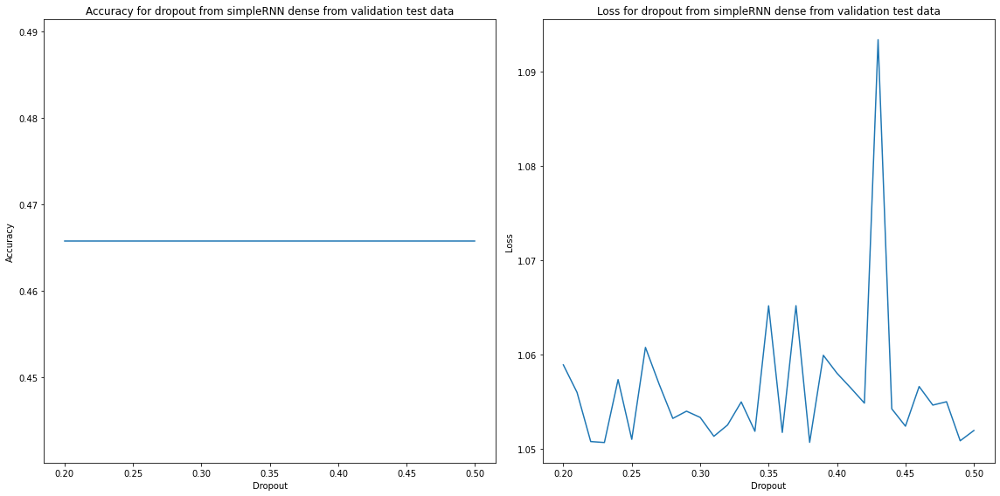

Best Dropout: 0.23
Best loss: 1.0506821870803833
Best accuracy: 0.46572935581207275


In [122]:
Dropout_list = [i/100 for i in range(20, 51)]
loss_list = []
accuracy_list = []

for j in Dropout_list:
    model = Sequential()
    model.add(SimpleRNN(66, activation='relu', input_shape=(X_validate.shape[1], 1), kernel_regularizer=regularizers.l2(0.0409)))
    model.add(Dropout(j))
    model.add(Dense(21, activation='relu', input_shape=(X_validate.shape[1],), kernel_regularizer=regularizers.l2(0.0617)))
    model.add(Dropout(0.35))
    model.add(Dense(3, activation='tanh', kernel_regularizer=regularizers.l2(0.0506)))
    model.add(Dropout(0.38))
    model.add(Dense(69, activation='relu', kernel_regularizer=regularizers.l2(0.0223)))
    model.add(Dropout(0.24))
    model.add(Dense(3, activation='softmax', kernel_regularizer=regularizers.l2(0.0244)))

    optimizer = Adam(learning_rate=0.0727)

    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    model.fit(X_validate, y_validate_categorical, epochs=10)

    model_score = model.evaluate(X_test_validate, y_test_validate_categorical)
    loss_list.append(model_score[0])
    accuracy_list.append(model_score[1])

fig, axes = plt.subplots(1,2, figsize=(16,8))
axes[0].plot(Dropout_list, accuracy_list)
axes[0].set_title('Accuracy for dropout from simpleRNN dense from validation test data')
axes[0].set_xlabel('Dropout')
axes[0].set_ylabel('Accuracy')

axes[1].plot(Dropout_list, loss_list)
axes[1].set_title('Loss for dropout from simpleRNN dense from validation test data')
axes[1].set_xlabel('Dropout')
axes[1].set_ylabel('Loss')

plt.tight_layout()
plt.savefig('RNN3.jpg')
plt.show() 

full_Dropout_list = list(zip(loss_list, accuracy_list))
full_Dropout_list = np.array(full_Dropout_list) 

best_accuracy_indices = np.where(full_Dropout_list[:, 1] == max(accuracy_list))[0]
best_loss_index = np.argmin(full_Dropout_list[best_accuracy_indices, 0])
best_index = best_accuracy_indices[best_loss_index]
best_loss = full_Dropout_list[best_index, 0]
best_accuracy = full_Dropout_list[best_index, 1]
best_Dropout = Dropout_list[best_index]
print(f'Best Dropout: {best_Dropout}')
print(f'Best loss: {best_loss}')
print(f'Best accuracy: {best_accuracy}')


Epoch 1/10
89/89 [==============================] - 2s 4ms/step - loss: 1.3043 - accuracy: 0.4661
Epoch 2/10
89/89 [==============================] - 0s 4ms/step - loss: 1.0628 - accuracy: 0.4763
Epoch 3/10
89/89 [==============================] - 0s 4ms/step - loss: 1.0536 - accuracy: 0.4763
Epoch 4/10
89/89 [==============================] - 0s 4ms/step - loss: 1.0573 - accuracy: 0.4763
Epoch 5/10
89/89 [==============================] - 0s 4ms/step - loss: 1.0512 - accuracy: 0.4763
Epoch 6/10
89/89 [==============================] - 0s 4ms/step - loss: 1.0529 - accuracy: 0.4763
Epoch 7/10
89/89 [==============================] - 0s 5ms/step - loss: 1.0527 - accuracy: 0.4763
Epoch 8/10
89/89 [==============================] - 0s 4ms/step - loss: 1.0570 - accuracy: 0.4763
Epoch 9/10
89/89 [==============================] - 0s 4ms/step - loss: 1.0529 - accuracy: 0.4763
Epoch 10/10
11/11 [==============================] - 0s 2ms/step - loss: 1.0409 - accuracy: 0.4912
Epoch 1/10
89/89 [=

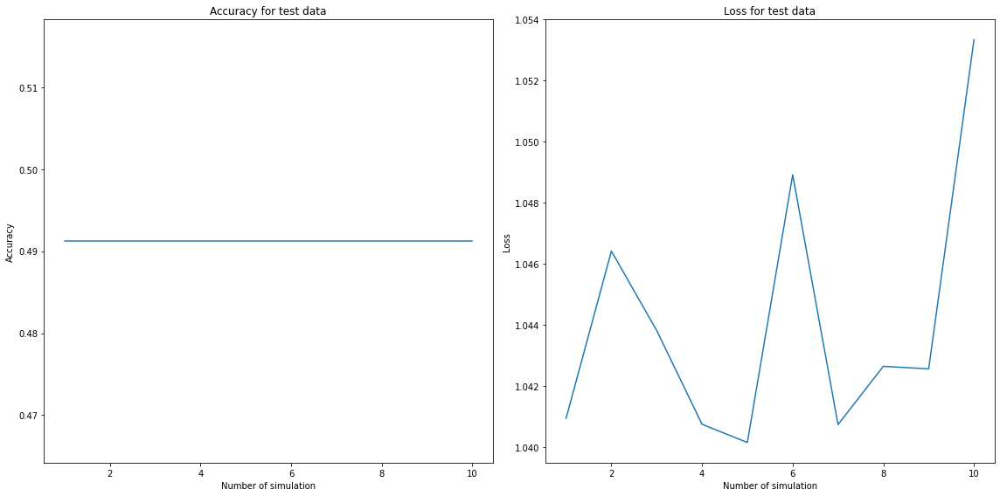

In [125]:
loss_list = []
accuracy_list = []

for i in range(10):
    model = Sequential()
    model.add(SimpleRNN(66, activation='relu', input_shape=(X_validate.shape[1], 1), kernel_regularizer=regularizers.l2(0.0409)))
    model.add(Dropout(0.23))
    model.add(Dense(21, activation='relu', kernel_regularizer=regularizers.l2(0.0617)))
    model.add(Dropout(0.35))
    model.add(Dense(3, activation='tanh', kernel_regularizer=regularizers.l2(0.0506)))
    model.add(Dropout(0.38))
    model.add(Dense(69, activation='relu', kernel_regularizer=regularizers.l2(0.0223)))
    model.add(Dropout(0.24))
    model.add(Dense(3, activation='softmax', kernel_regularizer=regularizers.l2(0.0244)))

    optimizer = Adam(learning_rate=0.0727)

    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    model.fit(X_train.reshape(X_train.shape[0], X_train.shape[1], 1), y_train_categorical, epochs=10)

    model_score = model.evaluate(X_test.reshape(X_test.shape[0], X_test.shape[1], 1), y_test_categorical)
    loss_list.append(model_score[0])
    accuracy_list.append(model_score[1])

fig, axes = plt.subplots(1,2, figsize=(16,8))
axes[0].plot(range(1,11), accuracy_list)
axes[0].set_title('Accuracy for test data')
axes[0].set_xlabel('Number of simulation')
axes[0].set_ylabel('Accuracy')

axes[1].plot(range(1,11), loss_list)
axes[1].set_title('Loss for test data')
axes[1].set_xlabel('Number of simulation')
axes[1].set_ylabel('Loss')

plt.tight_layout()
plt.show() 


# LSTM

Epoch 1/10
72/72 [==============================] - 2s 4ms/step - loss: 1.1086 - accuracy: 0.4789
Epoch 2/10
72/72 [==============================] - 0s 4ms/step - loss: 1.0611 - accuracy: 0.4749
Epoch 3/10
72/72 [==============================] - 0s 4ms/step - loss: 1.0549 - accuracy: 0.4789
Epoch 4/10
72/72 [==============================] - 0s 4ms/step - loss: 1.0504 - accuracy: 0.4789
Epoch 5/10
72/72 [==============================] - 0s 4ms/step - loss: 1.0524 - accuracy: 0.4789
Epoch 6/10
72/72 [==============================] - 0s 3ms/step - loss: 1.0548 - accuracy: 0.4789
Epoch 7/10
72/72 [==============================] - 0s 4ms/step - loss: 1.0549 - accuracy: 0.4789
Epoch 8/10
72/72 [==============================] - 0s 4ms/step - loss: 1.0551 - accuracy: 0.4688
Epoch 9/10
72/72 [==============================] - 0s 4ms/step - loss: 1.0535 - accuracy: 0.4789
Epoch 10/10
18/18 [==============================] - 0s 3ms/step - loss: 1.0658 - accuracy: 0.4657
Epoch 1/10
72/72 [=

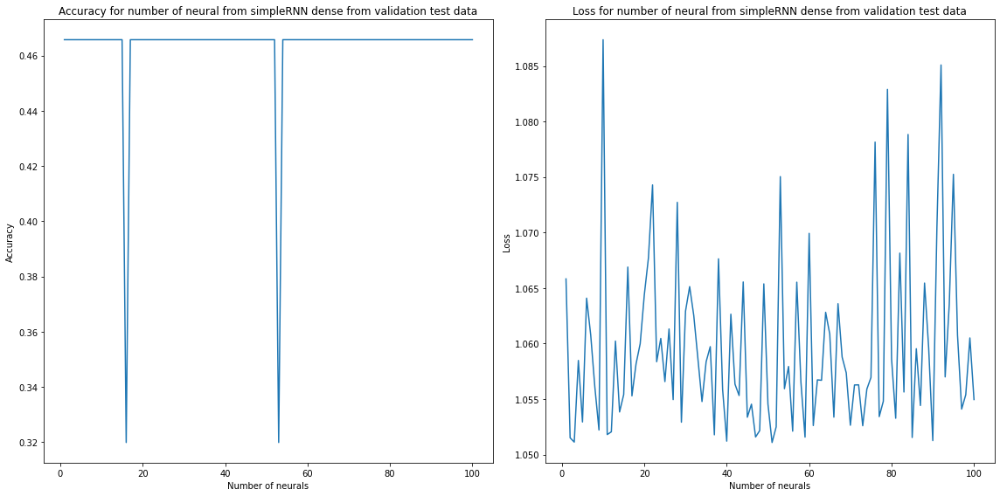

Best Number of neurons: 51
Best loss: 1.0510872602462769
Best accuracy: 0.46572935581207275


In [127]:
layer1_neuron = [i for i in range(1, 101)]
loss_list = []
accuracy_list = []

for j in layer1_neuron:
    model = Sequential()
    model.add(LSTM(j, activation='relu', input_shape=(X_validate.shape[1], 1), kernel_regularizer=regularizers.l2(0.0409)))
    model.add(Dropout(0.23))
    model.add(Dense(21, activation='relu', kernel_regularizer=regularizers.l2(0.0617)))
    model.add(Dropout(0.35))
    model.add(Dense(3, activation='tanh', kernel_regularizer=regularizers.l2(0.0506)))
    model.add(Dropout(0.38))
    model.add(Dense(69, activation='relu', kernel_regularizer=regularizers.l2(0.0223)))
    model.add(Dropout(0.24))
    model.add(Dense(3, activation='softmax', kernel_regularizer=regularizers.l2(0.0244)))

    optimizer = Adam(learning_rate=0.0969)

    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    model.fit(X_validate, y_validate_categorical, epochs=10)

    model_score = model.evaluate(X_test_validate, y_test_validate_categorical)
    loss_list.append(model_score[0])
    accuracy_list.append(model_score[1])

fig, axes = plt.subplots(1,2, figsize=(16,8))
axes[0].plot(layer1_neuron, accuracy_list)
axes[0].set_title('Accuracy for number of neural from simpleRNN dense from validation test data')
axes[0].set_xlabel('Number of neurals')
axes[0].set_ylabel('Accuracy')

axes[1].plot(layer1_neuron, loss_list)
axes[1].set_title('Loss for number of neural from simpleRNN dense from validation test data')
axes[1].set_xlabel('Number of neurals')
axes[1].set_ylabel('Loss')

plt.tight_layout()
plt.savefig('LSTM1.jpg')
plt.show()

full_layer1_neuron = list(zip(loss_list, accuracy_list))
full_layer1_neuron = np.array(full_layer1_neuron) 

best_accuracy_indices = np.where(full_layer1_neuron[:, 1] == max(accuracy_list))[0]
best_loss_index = np.argmin(full_layer1_neuron[best_accuracy_indices, 0])
best_index = best_accuracy_indices[best_loss_index]
best_loss = full_layer1_neuron[best_index, 0]
best_accuracy = full_layer1_neuron[best_index, 1]
best_number_neuron = layer1_neuron[best_index]
print(f'Best Number of neurons: {best_number_neuron}')
print(f'Best loss: {best_loss}')
print(f'Best accuracy: {best_accuracy}')


Epoch 1/10
72/72 [==============================] - 2s 7ms/step - loss: 1.3421 - accuracy: 0.4587
Epoch 2/10
72/72 [==============================] - 0s 6ms/step - loss: 1.2332 - accuracy: 0.4789
Epoch 3/10
72/72 [==============================] - 0s 7ms/step - loss: 1.0699 - accuracy: 0.4789
Epoch 4/10
72/72 [==============================] - 0s 7ms/step - loss: 1.0552 - accuracy: 0.4789
Epoch 5/10
72/72 [==============================] - 0s 7ms/step - loss: 1.0540 - accuracy: 0.4789
Epoch 6/10
72/72 [==============================] - 0s 6ms/step - loss: 1.0511 - accuracy: 0.4789
Epoch 7/10
72/72 [==============================] - 0s 7ms/step - loss: 1.0522 - accuracy: 0.4789
Epoch 8/10
72/72 [==============================] - 0s 7ms/step - loss: 1.0533 - accuracy: 0.4789
Epoch 9/10
72/72 [==============================] - 0s 7ms/step - loss: 1.0561 - accuracy: 0.4789
Epoch 10/10
18/18 [==============================] - 0s 3ms/step - loss: 1.0555 - accuracy: 0.4657
Epoch 1/10
72/72 [=

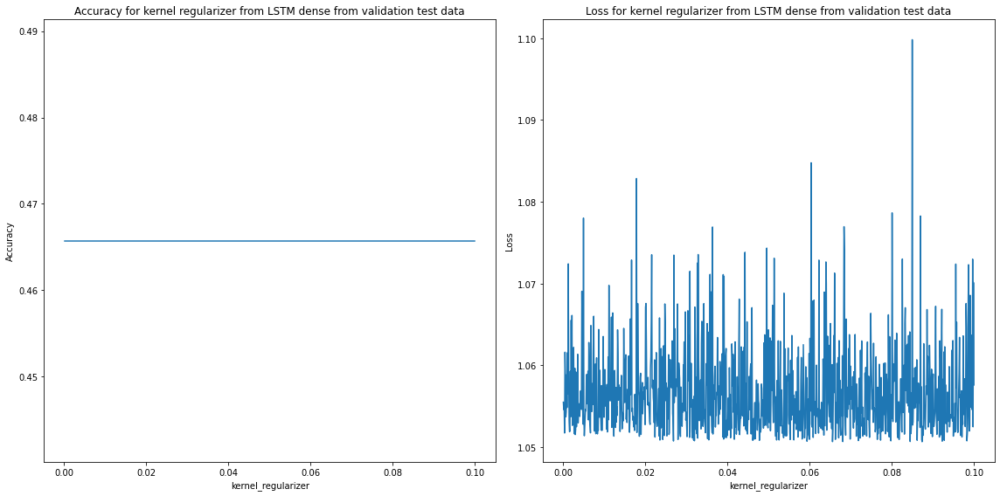

Best kernel_regularizer: 0.0874
Best loss: 1.0506573915481567
Best accuracy: 0.46572935581207275


In [128]:
kernel_regularizer_list = [i/10000 for i in range(1, 1001)]
loss_list = []
accuracy_list = []

for j in kernel_regularizer_list:
    model = Sequential()
    model.add(LSTM(51, activation='relu', input_shape=(X_validate.shape[1], 1), kernel_regularizer=regularizers.l2(j)))
    model.add(Dropout(0.23))
    model.add(Dense(21, activation='relu', kernel_regularizer=regularizers.l2(0.0617)))
    model.add(Dropout(0.35))
    model.add(Dense(3, activation='tanh', kernel_regularizer=regularizers.l2(0.0506)))
    model.add(Dropout(0.38))
    model.add(Dense(69, activation='relu', kernel_regularizer=regularizers.l2(0.0223)))
    model.add(Dropout(0.24))
    model.add(Dense(3, activation='softmax', kernel_regularizer=regularizers.l2(0.0244)))

    optimizer = Adam(learning_rate=0.0727)

    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    model.fit(X_validate, y_validate_categorical, epochs=10)

    model_score = model.evaluate(X_test_validate, y_test_validate_categorical)
    loss_list.append(model_score[0])
    accuracy_list.append(model_score[1])

fig, axes = plt.subplots(1,2, figsize=(16,8))
axes[0].plot(kernel_regularizer_list, accuracy_list)
axes[0].set_title('Accuracy for kernel regularizer from LSTM dense from validation test data')
axes[0].set_xlabel('kernel_regularizer')
axes[0].set_ylabel('Accuracy')

axes[1].plot(kernel_regularizer_list, loss_list)
axes[1].set_title('Loss for kernel regularizer from LSTM dense from validation test data')
axes[1].set_xlabel('kernel_regularizer')
axes[1].set_ylabel('Loss')

plt.tight_layout()
plt.savefig('LSTM2.jpg')
plt.show() 

full_kernel_regularizer_list = list(zip(loss_list, accuracy_list))
full_kernel_regularizer_list = np.array(full_kernel_regularizer_list) 

best_accuracy_indices = np.where(full_kernel_regularizer_list[:, 1] == max(accuracy_list))[0]
best_loss_index = np.argmin(full_kernel_regularizer_list[best_accuracy_indices, 0])
best_index = best_accuracy_indices[best_loss_index]
best_loss = full_kernel_regularizer_list[best_index, 0]
best_accuracy = full_kernel_regularizer_list[best_index, 1]
best_kernel_regularizer = kernel_regularizer_list[best_index]
print(f'Best kernel_regularizer: {best_kernel_regularizer}')
print(f'Best loss: {best_loss}')
print(f'Best accuracy: {best_accuracy}')


Epoch 1/10
72/72 [==============================] - 3s 8ms/step - loss: 1.4974 - accuracy: 0.4648
Epoch 2/10
72/72 [==============================] - 1s 8ms/step - loss: 1.1626 - accuracy: 0.4789
Epoch 3/10
72/72 [==============================] - 1s 10ms/step - loss: 1.0607 - accuracy: 0.4789
Epoch 4/10
72/72 [==============================] - 1s 10ms/step - loss: 1.0550 - accuracy: 0.4789
Epoch 5/10
72/72 [==============================] - 1s 8ms/step - loss: 1.0538 - accuracy: 0.4789
Epoch 6/10
72/72 [==============================] - 1s 9ms/step - loss: 1.0530 - accuracy: 0.4789
Epoch 7/10
72/72 [==============================] - 1s 9ms/step - loss: 1.0539 - accuracy: 0.4789
Epoch 8/10
72/72 [==============================] - 1s 9ms/step - loss: 1.0554 - accuracy: 0.4789
Epoch 9/10
72/72 [==============================] - 1s 9ms/step - loss: 1.0538 - accuracy: 0.4789
Epoch 10/10
18/18 [==============================] - 0s 3ms/step - loss: 1.0566 - accuracy: 0.4657
Epoch 1/10
72/72 

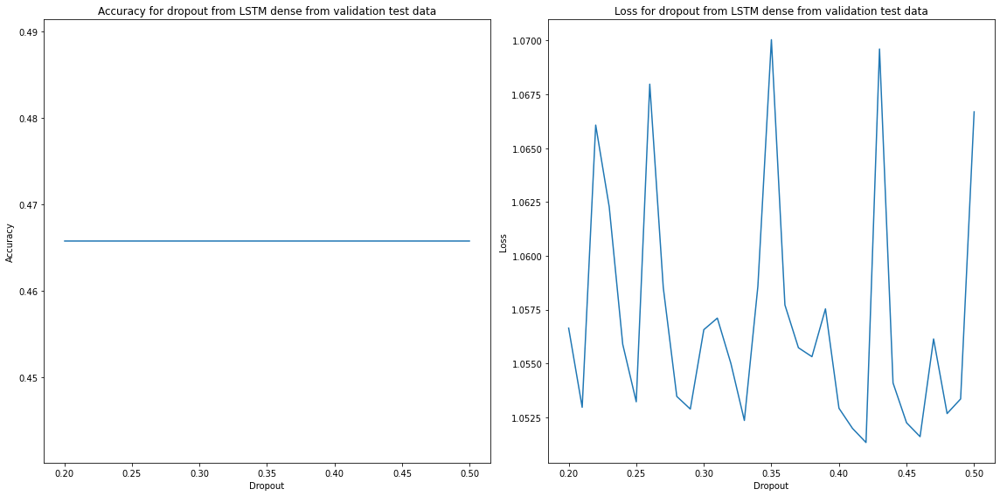

Best Dropout: 0.42
Best loss: 1.0513310432434082
Best accuracy: 0.46572935581207275


In [130]:
Dropout_list = [i/100 for i in range(20, 51)]
loss_list = []
accuracy_list = []

for j in Dropout_list:
    model = Sequential()
    model.add(LSTM(51, activation='relu', input_shape=(X_validate.shape[1], 1), kernel_regularizer=regularizers.l2(0.0874)))
    model.add(Dropout(j))
    model.add(Dense(21, activation='relu', kernel_regularizer=regularizers.l2(0.0617)))
    model.add(Dropout(0.35))
    model.add(Dense(3, activation='tanh', kernel_regularizer=regularizers.l2(0.0506)))
    model.add(Dropout(0.38))
    model.add(Dense(69, activation='relu', kernel_regularizer=regularizers.l2(0.0223)))
    model.add(Dropout(0.24))
    model.add(Dense(3, activation='softmax', kernel_regularizer=regularizers.l2(0.0244)))

    optimizer = Adam(learning_rate=0.0727)

    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    model.fit(X_validate, y_validate_categorical, epochs=10)

    model_score = model.evaluate(X_test_validate, y_test_validate_categorical)
    loss_list.append(model_score[0])
    accuracy_list.append(model_score[1])

fig, axes = plt.subplots(1,2, figsize=(16,8))
axes[0].plot(Dropout_list, accuracy_list)
axes[0].set_title('Accuracy for dropout from LSTM dense from validation test data')
axes[0].set_xlabel('Dropout')
axes[0].set_ylabel('Accuracy')

axes[1].plot(Dropout_list, loss_list)
axes[1].set_title('Loss for dropout from LSTM dense from validation test data')
axes[1].set_xlabel('Dropout')
axes[1].set_ylabel('Loss')

plt.tight_layout()
plt.savefig('LSTM3.jpg')
plt.show() 

full_Dropout_list = list(zip(loss_list, accuracy_list))
full_Dropout_list = np.array(full_Dropout_list) 

best_accuracy_indices = np.where(full_Dropout_list[:, 1] == max(accuracy_list))[0]
best_loss_index = np.argmin(full_Dropout_list[best_accuracy_indices, 0])
best_index = best_accuracy_indices[best_loss_index]
best_loss = full_Dropout_list[best_index, 0]
best_accuracy = full_Dropout_list[best_index, 1]
best_Dropout = Dropout_list[best_index]
print(f'Best Dropout: {best_Dropout}')
print(f'Best loss: {best_loss}')
print(f'Best accuracy: {best_accuracy}')


Epoch 1/10
89/89 [==============================] - 3s 9ms/step - loss: 1.4396 - accuracy: 0.4668
Epoch 2/10
89/89 [==============================] - 1s 8ms/step - loss: 1.0885 - accuracy: 0.4763
Epoch 3/10
89/89 [==============================] - 1s 7ms/step - loss: 1.0570 - accuracy: 0.4763
Epoch 4/10
89/89 [==============================] - 1s 11ms/step - loss: 1.0535 - accuracy: 0.4763
Epoch 5/10
89/89 [==============================] - 1s 8ms/step - loss: 1.0530 - accuracy: 0.4763
Epoch 6/10
89/89 [==============================] - 1s 9ms/step - loss: 1.0561 - accuracy: 0.4763
Epoch 7/10
89/89 [==============================] - 1s 9ms/step - loss: 1.0594 - accuracy: 0.4763
Epoch 8/10
89/89 [==============================] - 1s 8ms/step - loss: 1.0534 - accuracy: 0.4763
Epoch 9/10
89/89 [==============================] - 1s 11ms/step - loss: 1.0537 - accuracy: 0.4763
Epoch 10/10
11/11 [==============================] - 0s 3ms/step - loss: 1.0421 - accuracy: 0.4912
Epoch 1/10
89/89 

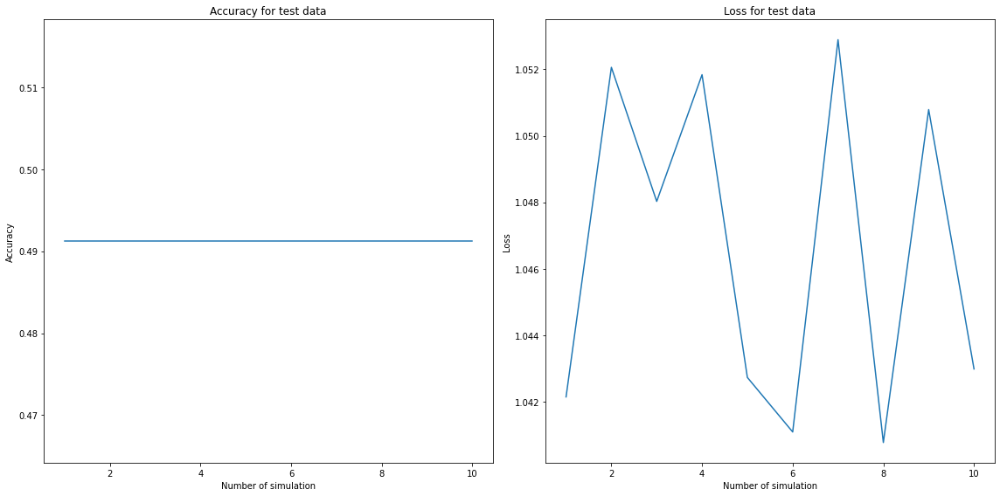

In [131]:
loss_list = []
accuracy_list = []

for i in range(10):
    model = Sequential()
    model.add(LSTM(51, activation='relu', input_shape=(X_validate.shape[1], 1), kernel_regularizer=regularizers.l2(0.0874)))
    model.add(Dropout(0.42))
    model.add(Dense(21, activation='relu', kernel_regularizer=regularizers.l2(0.0617)))
    model.add(Dropout(0.35))
    model.add(Dense(3, activation='tanh', kernel_regularizer=regularizers.l2(0.0506)))
    model.add(Dropout(0.38))
    model.add(Dense(69, activation='relu', kernel_regularizer=regularizers.l2(0.0223)))
    model.add(Dropout(0.24))
    model.add(Dense(3, activation='softmax', kernel_regularizer=regularizers.l2(0.0244)))

    optimizer = Adam(learning_rate=0.0727)

    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    model.fit(X_train.reshape(X_train.shape[0], X_train.shape[1], 1), y_train_categorical, epochs=10)

    model_score = model.evaluate(X_test.reshape(X_test.shape[0], X_test.shape[1], 1), y_test_categorical)
    loss_list.append(model_score[0])
    accuracy_list.append(model_score[1])

fig, axes = plt.subplots(1,2, figsize=(16,8))
axes[0].plot(range(1,11), accuracy_list)
axes[0].set_title('Accuracy for test data')
axes[0].set_xlabel('Number of simulation')
axes[0].set_ylabel('Accuracy')

axes[1].plot(range(1,11), loss_list)
axes[1].set_title('Loss for test data')
axes[1].set_xlabel('Number of simulation')
axes[1].set_ylabel('Loss')

plt.tight_layout()
plt.show() 


# GRU

Epoch 1/10
72/72 [==============================] - 8s 4ms/step - loss: 1.1051 - accuracy: 0.4727
Epoch 2/10
72/72 [==============================] - 0s 5ms/step - loss: 1.0654 - accuracy: 0.4789
Epoch 3/10
72/72 [==============================] - 0s 4ms/step - loss: 1.0533 - accuracy: 0.4789
Epoch 4/10
72/72 [==============================] - 0s 4ms/step - loss: 1.0577 - accuracy: 0.4789
Epoch 5/10
72/72 [==============================] - 0s 4ms/step - loss: 1.0524 - accuracy: 0.4789
Epoch 6/10
72/72 [==============================] - 0s 5ms/step - loss: 1.0542 - accuracy: 0.4789
Epoch 7/10
72/72 [==============================] - 0s 5ms/step - loss: 1.0583 - accuracy: 0.4789
Epoch 8/10
72/72 [==============================] - 0s 5ms/step - loss: 1.0607 - accuracy: 0.4789
Epoch 9/10
72/72 [==============================] - 0s 5ms/step - loss: 1.0535 - accuracy: 0.4789
Epoch 10/10
18/18 [==============================] - 0s 2ms/step - loss: 1.0532 - accuracy: 0.4657
Epoch 1/10
72/72 [=

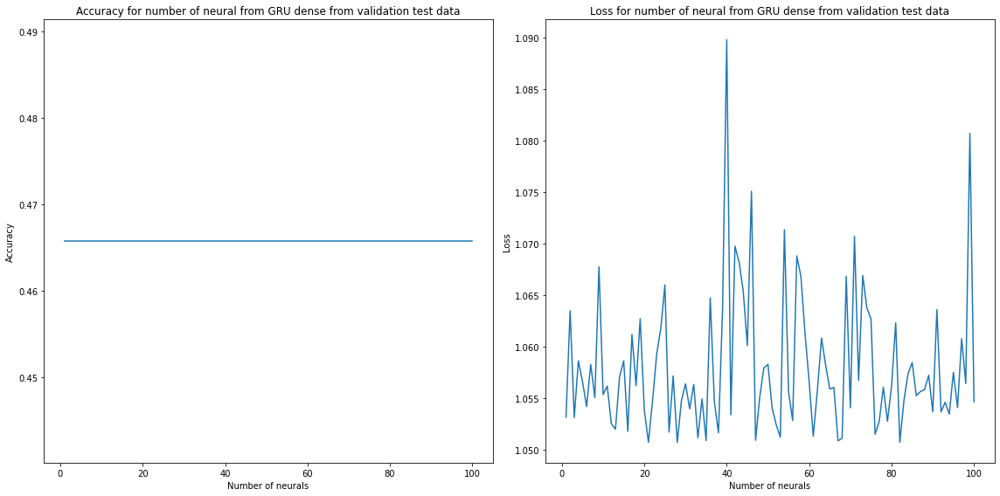

Best Number of neurons: 28
Best loss: 1.0507036447525024
Best accuracy: 0.46572935581207275


In [134]:
layer1_neuron = [i for i in range(1, 101)]
loss_list = []
accuracy_list = []

for j in layer1_neuron:
    model = Sequential()
    model.add(GRU(j, activation='relu', input_shape=(X_validate.shape[1], 1), kernel_regularizer=regularizers.l2(0.0409)))
    model.add(Dropout(0.23))
    model.add(Dense(21, activation='relu', kernel_regularizer=regularizers.l2(0.0617)))
    model.add(Dropout(0.35))
    model.add(Dense(3, activation='tanh', kernel_regularizer=regularizers.l2(0.0506)))
    model.add(Dropout(0.38))
    model.add(Dense(69, activation='relu', kernel_regularizer=regularizers.l2(0.0223)))
    model.add(Dropout(0.24))
    model.add(Dense(3, activation='softmax', kernel_regularizer=regularizers.l2(0.0244)))

    optimizer = Adam(learning_rate=0.0969)

    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    model.fit(X_validate, y_validate_categorical, epochs=10)

    model_score = model.evaluate(X_test_validate, y_test_validate_categorical)
    loss_list.append(model_score[0])
    accuracy_list.append(model_score[1])

fig, axes = plt.subplots(1,2, figsize=(16,8))
axes[0].plot(layer1_neuron, accuracy_list)
axes[0].set_title('Accuracy for number of neural from GRU dense from validation test data')
axes[0].set_xlabel('Number of neurals')
axes[0].set_ylabel('Accuracy')

axes[1].plot(layer1_neuron, loss_list)
axes[1].set_title('Loss for number of neural from GRU dense from validation test data')
axes[1].set_xlabel('Number of neurals')
axes[1].set_ylabel('Loss')

plt.tight_layout()
plt.savefig('GRU1.jpg')
plt.show()

full_layer1_neuron = list(zip(loss_list, accuracy_list))
full_layer1_neuron = np.array(full_layer1_neuron) 

best_accuracy_indices = np.where(full_layer1_neuron[:, 1] == max(accuracy_list))[0]
best_loss_index = np.argmin(full_layer1_neuron[best_accuracy_indices, 0])
best_index = best_accuracy_indices[best_loss_index]
best_loss = full_layer1_neuron[best_index, 0]
best_accuracy = full_layer1_neuron[best_index, 1]
best_number_neuron = layer1_neuron[best_index]
print(f'Best Number of neurons: {best_number_neuron}')
print(f'Best loss: {best_loss}')
print(f'Best accuracy: {best_accuracy}')


Epoch 1/10
72/72 [==============================] - 2s 4ms/step - loss: 1.3214 - accuracy: 0.4723
Epoch 2/10
72/72 [==============================] - 0s 4ms/step - loss: 1.0945 - accuracy: 0.4789
Epoch 3/10
72/72 [==============================] - 0s 4ms/step - loss: 1.0568 - accuracy: 0.4789
Epoch 4/10
72/72 [==============================] - 0s 4ms/step - loss: 1.0516 - accuracy: 0.4789
Epoch 5/10
72/72 [==============================] - 0s 4ms/step - loss: 1.0536 - accuracy: 0.4789
Epoch 6/10
72/72 [==============================] - 0s 4ms/step - loss: 1.0538 - accuracy: 0.4789
Epoch 7/10
72/72 [==============================] - 0s 4ms/step - loss: 1.0521 - accuracy: 0.4789
Epoch 8/10
72/72 [==============================] - 0s 4ms/step - loss: 1.0547 - accuracy: 0.4789
Epoch 9/10
72/72 [==============================] - 0s 4ms/step - loss: 1.0532 - accuracy: 0.4789
Epoch 10/10
18/18 [==============================] - 0s 2ms/step - loss: 1.0516 - accuracy: 0.4657
Epoch 1/10
72/72 [=

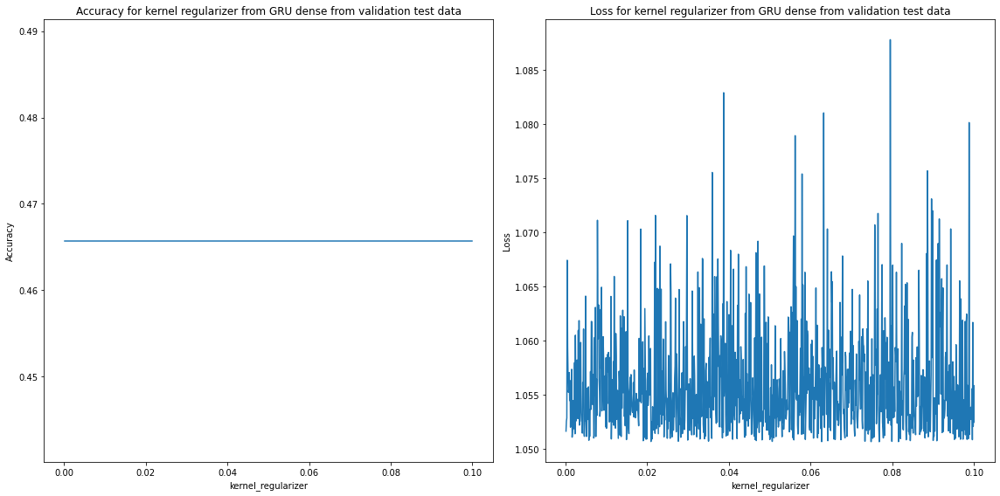

Best kernel_regularizer: 0.0768
Best loss: 1.050652265548706
Best accuracy: 0.46572935581207275


In [135]:
kernel_regularizer_list = [i/10000 for i in range(1, 1001)]
loss_list = []
accuracy_list = []

for j in kernel_regularizer_list:
    model = Sequential()
    model.add(GRU(28, activation='relu', input_shape=(X_validate.shape[1], 1), kernel_regularizer=regularizers.l2(j)))
    model.add(Dropout(0.23))
    model.add(Dense(21, activation='relu', kernel_regularizer=regularizers.l2(0.0617)))
    model.add(Dropout(0.35))
    model.add(Dense(3, activation='tanh', kernel_regularizer=regularizers.l2(0.0506)))
    model.add(Dropout(0.38))
    model.add(Dense(69, activation='relu', kernel_regularizer=regularizers.l2(0.0223)))
    model.add(Dropout(0.24))
    model.add(Dense(3, activation='softmax', kernel_regularizer=regularizers.l2(0.0244)))

    optimizer = Adam(learning_rate=0.0727)

    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    model.fit(X_validate, y_validate_categorical, epochs=10)

    model_score = model.evaluate(X_test_validate, y_test_validate_categorical)
    loss_list.append(model_score[0])
    accuracy_list.append(model_score[1])

fig, axes = plt.subplots(1,2, figsize=(16,8))
axes[0].plot(kernel_regularizer_list, accuracy_list)
axes[0].set_title('Accuracy for kernel regularizer from GRU dense from validation test data')
axes[0].set_xlabel('kernel_regularizer')
axes[0].set_ylabel('Accuracy')

axes[1].plot(kernel_regularizer_list, loss_list)
axes[1].set_title('Loss for kernel regularizer from GRU dense from validation test data')
axes[1].set_xlabel('kernel_regularizer')
axes[1].set_ylabel('Loss')

plt.tight_layout()
plt.savefig('GRU2.jpg')
plt.show() 

full_kernel_regularizer_list = list(zip(loss_list, accuracy_list))
full_kernel_regularizer_list = np.array(full_kernel_regularizer_list) 

best_accuracy_indices = np.where(full_kernel_regularizer_list[:, 1] == max(accuracy_list))[0]
best_loss_index = np.argmin(full_kernel_regularizer_list[best_accuracy_indices, 0])
best_index = best_accuracy_indices[best_loss_index]
best_loss = full_kernel_regularizer_list[best_index, 0]
best_accuracy = full_kernel_regularizer_list[best_index, 1]
best_kernel_regularizer = kernel_regularizer_list[best_index]
print(f'Best kernel_regularizer: {best_kernel_regularizer}')
print(f'Best loss: {best_loss}')
print(f'Best accuracy: {best_accuracy}')


Epoch 1/10
72/72 [==============================] - 2s 4ms/step - loss: 1.3342 - accuracy: 0.4639
Epoch 2/10
72/72 [==============================] - 0s 4ms/step - loss: 1.0569 - accuracy: 0.4789
Epoch 3/10
72/72 [==============================] - 0s 4ms/step - loss: 1.0542 - accuracy: 0.4789
Epoch 4/10
72/72 [==============================] - 0s 4ms/step - loss: 1.0562 - accuracy: 0.4789
Epoch 5/10
72/72 [==============================] - 0s 4ms/step - loss: 1.0561 - accuracy: 0.4789
Epoch 6/10
72/72 [==============================] - 0s 4ms/step - loss: 1.0567 - accuracy: 0.4789
Epoch 7/10
72/72 [==============================] - 0s 4ms/step - loss: 1.0513 - accuracy: 0.4789
Epoch 8/10
72/72 [==============================] - 0s 4ms/step - loss: 1.0535 - accuracy: 0.4789
Epoch 9/10
72/72 [==============================] - 0s 5ms/step - loss: 1.0537 - accuracy: 0.4789
Epoch 10/10
18/18 [==============================] - 0s 2ms/step - loss: 1.0546 - accuracy: 0.4657
Epoch 1/10
72/72 [=

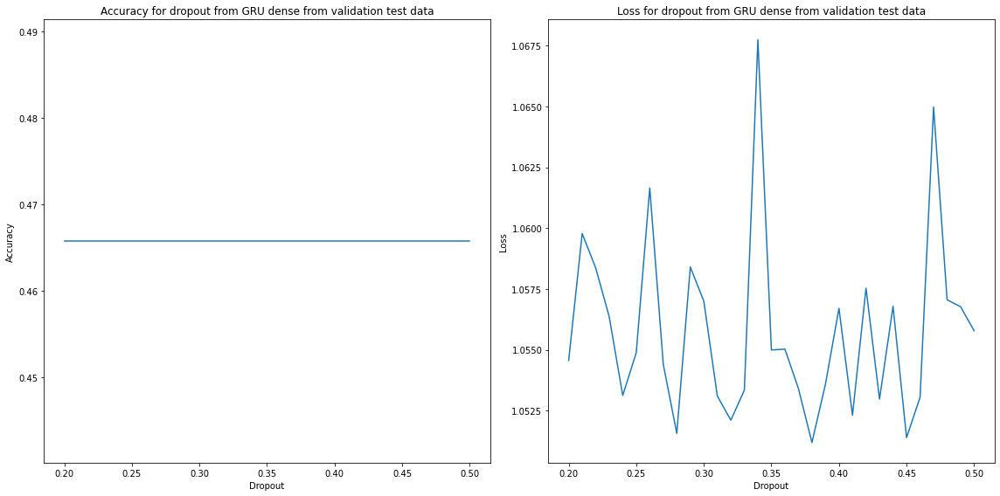

Best Dropout: 0.38
Best loss: 1.051191806793213
Best accuracy: 0.46572935581207275


In [136]:
Dropout_list = [i/100 for i in range(20, 51)]
loss_list = []
accuracy_list = []

for j in Dropout_list:
    model = Sequential()
    model.add(GRU(28, activation='relu', input_shape=(X_validate.shape[1], 1), kernel_regularizer=regularizers.l2(0.0768)))
    model.add(Dropout(j))
    model.add(Dense(21, activation='relu', kernel_regularizer=regularizers.l2(0.0617)))
    model.add(Dropout(0.35))
    model.add(Dense(3, activation='tanh', kernel_regularizer=regularizers.l2(0.0506)))
    model.add(Dropout(0.38))
    model.add(Dense(69, activation='relu', kernel_regularizer=regularizers.l2(0.0223)))
    model.add(Dropout(0.24))
    model.add(Dense(3, activation='softmax', kernel_regularizer=regularizers.l2(0.0244)))

    optimizer = Adam(learning_rate=0.0727)

    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    model.fit(X_validate, y_validate_categorical, epochs=10)

    model_score = model.evaluate(X_test_validate, y_test_validate_categorical)
    loss_list.append(model_score[0])
    accuracy_list.append(model_score[1])

fig, axes = plt.subplots(1,2, figsize=(16,8))
axes[0].plot(Dropout_list, accuracy_list)
axes[0].set_title('Accuracy for dropout from GRU dense from validation test data')
axes[0].set_xlabel('Dropout')
axes[0].set_ylabel('Accuracy')

axes[1].plot(Dropout_list, loss_list)
axes[1].set_title('Loss for dropout from GRU dense from validation test data')
axes[1].set_xlabel('Dropout')
axes[1].set_ylabel('Loss')

plt.tight_layout()
plt.savefig('GRU3.jpg')
plt.show() 

full_Dropout_list = list(zip(loss_list, accuracy_list))
full_Dropout_list = np.array(full_Dropout_list) 

best_accuracy_indices = np.where(full_Dropout_list[:, 1] == max(accuracy_list))[0]
best_loss_index = np.argmin(full_Dropout_list[best_accuracy_indices, 0])
best_index = best_accuracy_indices[best_loss_index]
best_loss = full_Dropout_list[best_index, 0]
best_accuracy = full_Dropout_list[best_index, 1]
best_Dropout = Dropout_list[best_index]
print(f'Best Dropout: {best_Dropout}')
print(f'Best loss: {best_loss}')
print(f'Best accuracy: {best_accuracy}')


Epoch 1/10
89/89 [==============================] - 2s 5ms/step - loss: 1.4335 - accuracy: 0.4562
Epoch 2/10
89/89 [==============================] - 0s 5ms/step - loss: 1.1104 - accuracy: 0.4763
Epoch 3/10
89/89 [==============================] - 0s 5ms/step - loss: 1.0680 - accuracy: 0.4763
Epoch 4/10
89/89 [==============================] - 0s 5ms/step - loss: 1.0600 - accuracy: 0.4763
Epoch 5/10
89/89 [==============================] - 0s 4ms/step - loss: 1.0569 - accuracy: 0.4763
Epoch 6/10
89/89 [==============================] - 0s 4ms/step - loss: 1.0548 - accuracy: 0.4763
Epoch 7/10
89/89 [==============================] - 0s 4ms/step - loss: 1.0557 - accuracy: 0.4763
Epoch 8/10
89/89 [==============================] - 0s 4ms/step - loss: 1.0544 - accuracy: 0.4763
Epoch 9/10
89/89 [==============================] - 0s 4ms/step - loss: 1.0569 - accuracy: 0.4763
Epoch 10/10
11/11 [==============================] - 0s 2ms/step - loss: 1.0420 - accuracy: 0.4912
Epoch 1/10
89/89 [=

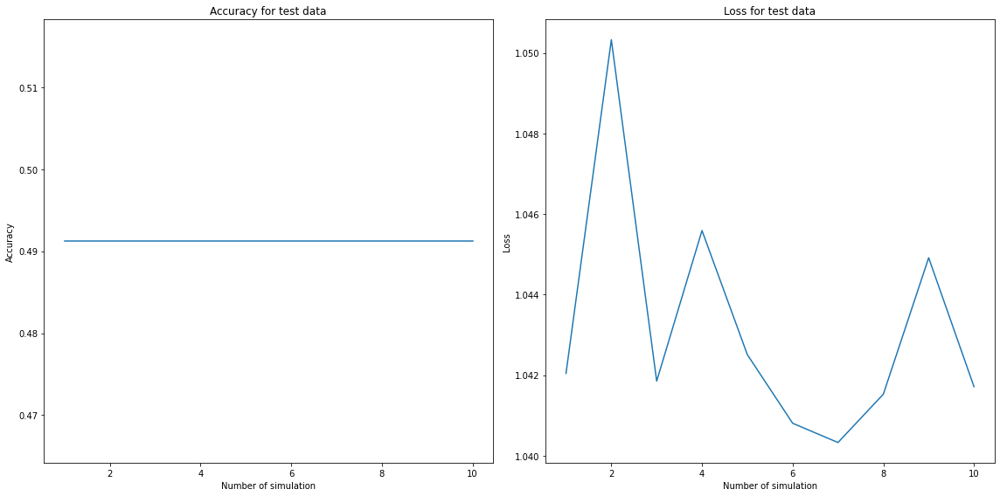

In [137]:
loss_list = []
accuracy_list = []

for i in range(10):
    model = Sequential()
    model.add(GRU(28, activation='relu', input_shape=(X_validate.shape[1], 1), kernel_regularizer=regularizers.l2(0.0768)))
    model.add(Dropout(0.38))
    model.add(Dense(21, activation='relu', kernel_regularizer=regularizers.l2(0.0617)))
    model.add(Dropout(0.35))
    model.add(Dense(3, activation='tanh', kernel_regularizer=regularizers.l2(0.0506)))
    model.add(Dropout(0.38))
    model.add(Dense(69, activation='relu', kernel_regularizer=regularizers.l2(0.0223)))
    model.add(Dropout(0.24))
    model.add(Dense(3, activation='softmax', kernel_regularizer=regularizers.l2(0.0244)))

    optimizer = Adam(learning_rate=0.0727)

    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

    model.fit(X_train.reshape(X_train.shape[0], X_train.shape[1], 1), y_train_categorical, epochs=10)

    model_score = model.evaluate(X_test.reshape(X_test.shape[0], X_test.shape[1], 1), y_test_categorical)
    loss_list.append(model_score[0])
    accuracy_list.append(model_score[1])

fig, axes = plt.subplots(1,2, figsize=(16,8))
axes[0].plot(range(1,11), accuracy_list)
axes[0].set_title('Accuracy for test data')
axes[0].set_xlabel('Number of simulation')
axes[0].set_ylabel('Accuracy')

axes[1].plot(range(1,11), loss_list)
axes[1].set_title('Loss for test data')
axes[1].set_xlabel('Number of simulation')
axes[1].set_ylabel('Loss')

plt.tight_layout()
plt.show() 
